# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

#FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:12<00:00, 4.99KFile/s] 


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

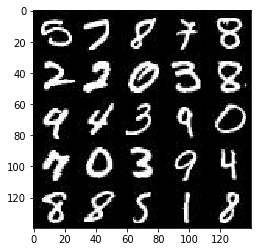

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

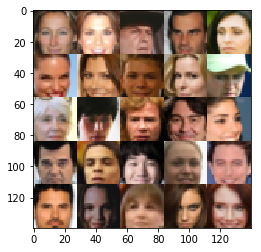

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='real_input')
    z_data = tf.placeholder(tf.float32, (None, z_dim), name='z_data')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return (real_input, z_data, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        
        # Input layer is 28x28x3
        conv_1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu_1 = tf.maximum(alpha * conv_1, conv_1)
        #now 14x14x64
        
        conv_2 = tf.layers.conv2d(relu_1, 128, 5, strides=2, padding='same')
        conv_2 = tf.layers.batch_normalization(conv_2, training=True)
        relu_2 = tf.maximum(alpha * conv_2, conv_2)
        #now 7x7x128
        
        conv_3 = tf.layers.conv2d(relu_2, 256, 5, strides=2, padding='same')
        conv_3 = tf.layers.batch_normalization(conv_3, training=True)
        relu_3 = tf.maximum(alpha * conv_3, conv_3)
        #now 4x4x256
        
        flatten = tf.reshape(relu_3, (-1, 4*4*256))
        logits = tf.layers.dense(flatten, 1)
        out = tf.sigmoid(logits)
        
    return (out, logits)



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    alpha = 0.2
        
    with tf.variable_scope('generator', reuse = not is_train):
        layer_1 = tf.layers.dense(z, 3*3*512)
        layer_1 = tf.reshape(layer_1, (-1, 3,3,512))
        layer_1 = tf.layers.batch_normalization(layer_1, training=is_train)
        relu_1 = tf.maximum(layer_1*alpha, layer_1)
        #print(relu_1.get_shape())
        # 3x3x512
        
        layer_2 = tf.layers.conv2d_transpose(relu_1, 256, 3, strides=2, padding='valid')
        layer_2 = tf.layers.batch_normalization(layer_2, training=is_train)
        relu_2 = tf.maximum(layer_2*alpha, layer_2)
        #print(relu_2.get_shape())
        # now 7x7x256
        
        layer_3 = tf.layers.conv2d_transpose(relu_2, 128, 5, strides=2, padding='same')
        layer_3 = tf.layers.batch_normalization(layer_3, training=is_train)
        relu_3 = tf.maximum(layer_3*alpha, layer_3)
        #print(relu_3.get_shape())
        # now 14x14x128
                
        logits = tf.layers.conv2d_transpose(relu_3, out_channel_dim, 5, strides=2, padding='same')
        #print(logits.get_shape())       
        #now 28x28x5
        
        out = tf.tanh(logits)
    
    return out



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [21]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    gen_out = generator(input_z, out_channel_dim)
    disc_real_out, disc_real_logits = discriminator(input_real)
    disc_fake_out, disc_fake_logits = discriminator(gen_out, reuse=True)
    
    disc_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_real_logits, labels=tf.ones_like(disc_real_out)))
    
    disc_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_fake_logits, labels=tf.zeros_like(disc_fake_out)))
    
    gen_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_fake_logits, labels=tf.ones_like(disc_fake_out)))
    
    disc_loss = disc_loss_real + disc_loss_fake
    
    return (disc_loss, gen_loss)



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [22]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    train_var = tf.trainable_variables()
    gen_var = [var for var in train_var if var.name.startswith('generator')]
    disc_var = [var for var in train_var if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        gen_train_op = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=gen_var)
        disc_train_op = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=disc_var)
        
    return (disc_train_op, gen_train_op)



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [23]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    real_input, z_input, ln_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(real_input, z_input, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, ln_rate, beta1)
    
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                batch_images = batch_images*2
                                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={real_input: batch_images, z_input: batch_z, ln_rate: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={z_input: batch_z, real_input: batch_images, ln_rate: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={z_input: batch_z, real_input: batch_images, ln_rate: learning_rate})
                # Every 10th batch, show generator output
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, z_input, data_shape[3], data_image_mode)
                    
        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.4941... Generator Loss: 0.2683
Epoch 1/2... Discriminator Loss: 2.5788... Generator Loss: 0.2072
Epoch 1/2... Discriminator Loss: 1.7409... Generator Loss: 0.8150
Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.6033
Epoch 1/2... Discriminator Loss: 0.9906... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 1.1541... Generator Loss: 1.1073
Epoch 1/2... Discriminator Loss: 1.2884... Generator Loss: 0.9432
Epoch 1/2... Discriminator Loss: 1.2892... Generator Loss: 0.5329
Epoch 1/2... Discriminator Loss: 1.4775... Generator Loss: 0.4333
Epoch 1/2... Discriminator Loss: 1.6268... Generator Loss: 1.1072


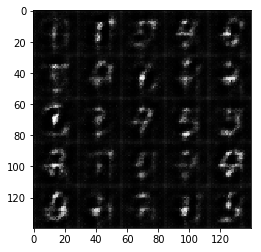

Epoch 1/2... Discriminator Loss: 1.3158... Generator Loss: 0.7324
Epoch 1/2... Discriminator Loss: 1.2736... Generator Loss: 0.6029
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 0.7363
Epoch 1/2... Discriminator Loss: 1.2952... Generator Loss: 1.0656
Epoch 1/2... Discriminator Loss: 1.0263... Generator Loss: 0.7726
Epoch 1/2... Discriminator Loss: 1.2516... Generator Loss: 1.2016
Epoch 1/2... Discriminator Loss: 1.1777... Generator Loss: 0.9927
Epoch 1/2... Discriminator Loss: 1.2815... Generator Loss: 0.8972
Epoch 1/2... Discriminator Loss: 1.2665... Generator Loss: 1.2904
Epoch 1/2... Discriminator Loss: 1.1399... Generator Loss: 0.7231


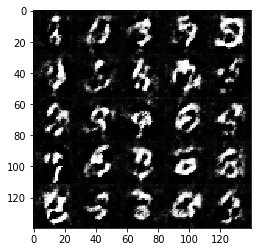

Epoch 1/2... Discriminator Loss: 1.0620... Generator Loss: 1.0882
Epoch 1/2... Discriminator Loss: 1.0446... Generator Loss: 0.9649
Epoch 1/2... Discriminator Loss: 1.0683... Generator Loss: 0.6855
Epoch 1/2... Discriminator Loss: 1.1842... Generator Loss: 1.2989
Epoch 1/2... Discriminator Loss: 1.4716... Generator Loss: 0.3609
Epoch 1/2... Discriminator Loss: 1.0919... Generator Loss: 0.8998
Epoch 1/2... Discriminator Loss: 1.2445... Generator Loss: 0.5006
Epoch 1/2... Discriminator Loss: 1.3235... Generator Loss: 0.4850
Epoch 1/2... Discriminator Loss: 1.1431... Generator Loss: 0.6866
Epoch 1/2... Discriminator Loss: 1.4808... Generator Loss: 0.3332


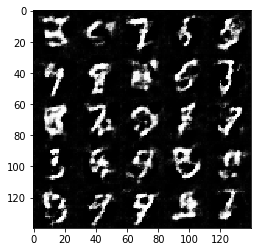

Epoch 1/2... Discriminator Loss: 1.1314... Generator Loss: 1.1231
Epoch 1/2... Discriminator Loss: 1.3595... Generator Loss: 1.6957
Epoch 1/2... Discriminator Loss: 1.1554... Generator Loss: 0.7819
Epoch 1/2... Discriminator Loss: 1.1461... Generator Loss: 1.2537
Epoch 1/2... Discriminator Loss: 1.1812... Generator Loss: 0.9602
Epoch 1/2... Discriminator Loss: 1.1026... Generator Loss: 0.9328
Epoch 1/2... Discriminator Loss: 1.1409... Generator Loss: 0.6331
Epoch 1/2... Discriminator Loss: 1.4776... Generator Loss: 0.3637
Epoch 1/2... Discriminator Loss: 1.2073... Generator Loss: 0.9148
Epoch 1/2... Discriminator Loss: 1.1186... Generator Loss: 1.0054


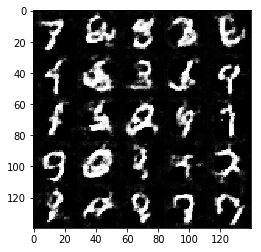

Epoch 1/2... Discriminator Loss: 1.2882... Generator Loss: 0.5623
Epoch 1/2... Discriminator Loss: 1.1625... Generator Loss: 0.6165
Epoch 1/2... Discriminator Loss: 1.3742... Generator Loss: 0.4400
Epoch 1/2... Discriminator Loss: 1.2446... Generator Loss: 0.8296
Epoch 1/2... Discriminator Loss: 1.2280... Generator Loss: 1.0720
Epoch 1/2... Discriminator Loss: 1.2237... Generator Loss: 0.6551
Epoch 2/2... Discriminator Loss: 1.2101... Generator Loss: 0.8008
Epoch 2/2... Discriminator Loss: 1.1918... Generator Loss: 0.7792
Epoch 2/2... Discriminator Loss: 1.2937... Generator Loss: 1.0084
Epoch 2/2... Discriminator Loss: 1.2269... Generator Loss: 0.6025


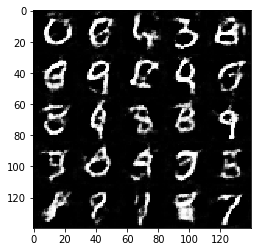

Epoch 2/2... Discriminator Loss: 1.1506... Generator Loss: 0.7786
Epoch 2/2... Discriminator Loss: 1.2621... Generator Loss: 0.5826
Epoch 2/2... Discriminator Loss: 1.2199... Generator Loss: 0.7104
Epoch 2/2... Discriminator Loss: 1.3395... Generator Loss: 0.5256
Epoch 2/2... Discriminator Loss: 1.3291... Generator Loss: 0.4946
Epoch 2/2... Discriminator Loss: 1.3644... Generator Loss: 0.4490
Epoch 2/2... Discriminator Loss: 1.2815... Generator Loss: 0.5403
Epoch 2/2... Discriminator Loss: 1.1300... Generator Loss: 0.9550
Epoch 2/2... Discriminator Loss: 1.3728... Generator Loss: 1.3217
Epoch 2/2... Discriminator Loss: 1.5541... Generator Loss: 0.3437


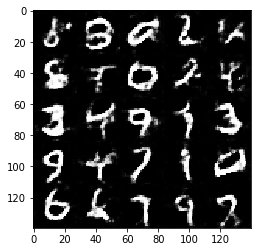

Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 0.5588
Epoch 2/2... Discriminator Loss: 1.3216... Generator Loss: 0.4813
Epoch 2/2... Discriminator Loss: 1.2546... Generator Loss: 0.8920
Epoch 2/2... Discriminator Loss: 1.3008... Generator Loss: 0.5521
Epoch 2/2... Discriminator Loss: 1.2693... Generator Loss: 0.5409
Epoch 2/2... Discriminator Loss: 1.2865... Generator Loss: 1.1668
Epoch 2/2... Discriminator Loss: 1.2831... Generator Loss: 0.9580
Epoch 2/2... Discriminator Loss: 1.2332... Generator Loss: 0.6260
Epoch 2/2... Discriminator Loss: 1.2366... Generator Loss: 0.5933
Epoch 2/2... Discriminator Loss: 1.3086... Generator Loss: 0.4930


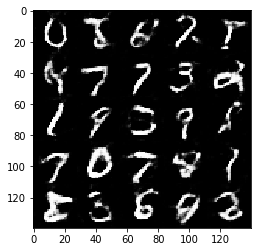

Epoch 2/2... Discriminator Loss: 1.5672... Generator Loss: 0.3037
Epoch 2/2... Discriminator Loss: 1.2182... Generator Loss: 0.6068
Epoch 2/2... Discriminator Loss: 1.3271... Generator Loss: 0.4606
Epoch 2/2... Discriminator Loss: 1.2549... Generator Loss: 0.5901
Epoch 2/2... Discriminator Loss: 1.1971... Generator Loss: 0.7568
Epoch 2/2... Discriminator Loss: 1.2812... Generator Loss: 0.5352
Epoch 2/2... Discriminator Loss: 1.2074... Generator Loss: 0.6110
Epoch 2/2... Discriminator Loss: 1.1774... Generator Loss: 0.6426
Epoch 2/2... Discriminator Loss: 1.2267... Generator Loss: 1.0230
Epoch 2/2... Discriminator Loss: 1.3465... Generator Loss: 1.2582


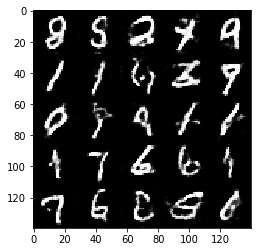

Epoch 2/2... Discriminator Loss: 1.2239... Generator Loss: 0.6622
Epoch 2/2... Discriminator Loss: 1.3613... Generator Loss: 1.3016
Epoch 2/2... Discriminator Loss: 1.1558... Generator Loss: 0.6429
Epoch 2/2... Discriminator Loss: 1.1545... Generator Loss: 0.8380
Epoch 2/2... Discriminator Loss: 1.2469... Generator Loss: 1.0811
Epoch 2/2... Discriminator Loss: 1.1194... Generator Loss: 0.6791
Epoch 2/2... Discriminator Loss: 1.2259... Generator Loss: 0.6119
Epoch 2/2... Discriminator Loss: 1.2021... Generator Loss: 1.0204
Epoch 2/2... Discriminator Loss: 1.3065... Generator Loss: 0.7253
Epoch 2/2... Discriminator Loss: 1.2613... Generator Loss: 0.6278


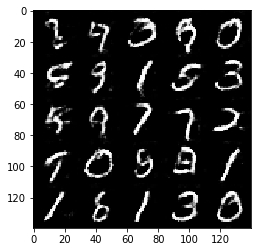

Epoch 2/2... Discriminator Loss: 1.0833... Generator Loss: 0.7170
Epoch 2/2... Discriminator Loss: 1.3775... Generator Loss: 0.4158
Epoch 2/2... Discriminator Loss: 1.3591... Generator Loss: 0.5027


In [25]:
batch_size = 128
z_dim = 100
learning_rate = .0002
beta1 = .50


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 3.0130... Generator Loss: 0.1566
Epoch 1/10... Discriminator Loss: 2.1694... Generator Loss: 0.5095
Epoch 1/10... Discriminator Loss: 1.9063... Generator Loss: 0.6638
Epoch 1/10... Discriminator Loss: 2.2965... Generator Loss: 0.4575
Epoch 1/10... Discriminator Loss: 1.4967... Generator Loss: 0.9039
Epoch 1/10... Discriminator Loss: 1.6871... Generator Loss: 0.6486
Epoch 1/10... Discriminator Loss: 1.4010... Generator Loss: 0.7303
Epoch 1/10... Discriminator Loss: 1.3935... Generator Loss: 0.8533
Epoch 1/10... Discriminator Loss: 2.0114... Generator Loss: 0.5010
Epoch 1/10... Discriminator Loss: 1.8500... Generator Loss: 0.5712


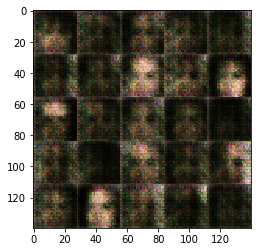

Epoch 1/10... Discriminator Loss: 1.6849... Generator Loss: 0.6087
Epoch 1/10... Discriminator Loss: 1.8194... Generator Loss: 0.5475
Epoch 1/10... Discriminator Loss: 1.7489... Generator Loss: 0.5361
Epoch 1/10... Discriminator Loss: 1.5497... Generator Loss: 0.7013
Epoch 1/10... Discriminator Loss: 1.5107... Generator Loss: 0.7438
Epoch 1/10... Discriminator Loss: 1.6244... Generator Loss: 0.6570
Epoch 1/10... Discriminator Loss: 1.5076... Generator Loss: 0.7230
Epoch 1/10... Discriminator Loss: 1.4838... Generator Loss: 0.6642
Epoch 1/10... Discriminator Loss: 1.5776... Generator Loss: 0.6989
Epoch 1/10... Discriminator Loss: 1.4782... Generator Loss: 0.6837


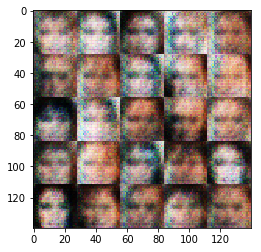

Epoch 1/10... Discriminator Loss: 1.4885... Generator Loss: 0.7094
Epoch 1/10... Discriminator Loss: 1.5338... Generator Loss: 0.6933
Epoch 1/10... Discriminator Loss: 1.3197... Generator Loss: 0.7020
Epoch 1/10... Discriminator Loss: 1.4725... Generator Loss: 0.7086
Epoch 1/10... Discriminator Loss: 1.4566... Generator Loss: 0.7340
Epoch 1/10... Discriminator Loss: 1.4852... Generator Loss: 0.6652
Epoch 1/10... Discriminator Loss: 1.5149... Generator Loss: 0.6379
Epoch 1/10... Discriminator Loss: 1.4910... Generator Loss: 0.6852
Epoch 1/10... Discriminator Loss: 1.4112... Generator Loss: 0.6391
Epoch 1/10... Discriminator Loss: 1.4880... Generator Loss: 0.5686


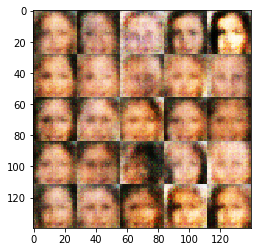

Epoch 1/10... Discriminator Loss: 1.4184... Generator Loss: 0.7212
Epoch 1/10... Discriminator Loss: 1.4792... Generator Loss: 0.6984
Epoch 1/10... Discriminator Loss: 1.4956... Generator Loss: 0.6484
Epoch 1/10... Discriminator Loss: 1.4339... Generator Loss: 0.6865
Epoch 1/10... Discriminator Loss: 1.6254... Generator Loss: 0.5821
Epoch 1/10... Discriminator Loss: 1.4036... Generator Loss: 0.6963
Epoch 1/10... Discriminator Loss: 1.6781... Generator Loss: 0.5935
Epoch 1/10... Discriminator Loss: 1.6300... Generator Loss: 0.6177
Epoch 1/10... Discriminator Loss: 1.5565... Generator Loss: 0.5920
Epoch 1/10... Discriminator Loss: 1.5130... Generator Loss: 0.7377


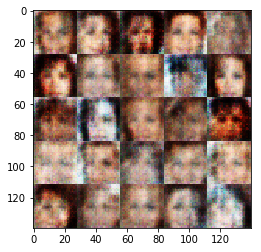

Epoch 1/10... Discriminator Loss: 1.5267... Generator Loss: 0.6629
Epoch 1/10... Discriminator Loss: 1.4097... Generator Loss: 0.7120
Epoch 1/10... Discriminator Loss: 1.4475... Generator Loss: 0.6229
Epoch 1/10... Discriminator Loss: 1.4514... Generator Loss: 0.6908
Epoch 1/10... Discriminator Loss: 1.5274... Generator Loss: 0.6028
Epoch 1/10... Discriminator Loss: 1.4920... Generator Loss: 0.6178
Epoch 1/10... Discriminator Loss: 1.4782... Generator Loss: 0.6477
Epoch 1/10... Discriminator Loss: 1.4381... Generator Loss: 0.6928
Epoch 1/10... Discriminator Loss: 1.3563... Generator Loss: 0.7165
Epoch 1/10... Discriminator Loss: 1.6401... Generator Loss: 0.6059


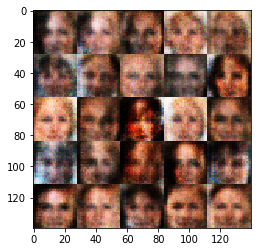

Epoch 1/10... Discriminator Loss: 1.5433... Generator Loss: 0.6889
Epoch 1/10... Discriminator Loss: 1.5863... Generator Loss: 0.5792
Epoch 1/10... Discriminator Loss: 1.4919... Generator Loss: 0.7087
Epoch 1/10... Discriminator Loss: 1.4734... Generator Loss: 0.6767
Epoch 1/10... Discriminator Loss: 1.4235... Generator Loss: 0.6652
Epoch 1/10... Discriminator Loss: 1.4829... Generator Loss: 0.7063
Epoch 1/10... Discriminator Loss: 1.5832... Generator Loss: 0.5636
Epoch 1/10... Discriminator Loss: 1.4816... Generator Loss: 0.6445
Epoch 1/10... Discriminator Loss: 1.4059... Generator Loss: 0.7508
Epoch 1/10... Discriminator Loss: 1.5651... Generator Loss: 0.6166


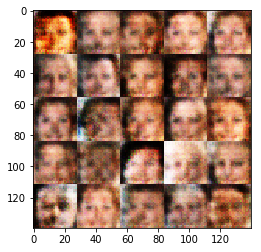

Epoch 1/10... Discriminator Loss: 1.4195... Generator Loss: 0.7438
Epoch 1/10... Discriminator Loss: 1.4553... Generator Loss: 0.6691
Epoch 1/10... Discriminator Loss: 1.4433... Generator Loss: 0.7015
Epoch 1/10... Discriminator Loss: 1.5064... Generator Loss: 0.6376
Epoch 1/10... Discriminator Loss: 1.4226... Generator Loss: 0.6908
Epoch 1/10... Discriminator Loss: 1.4081... Generator Loss: 0.6613
Epoch 1/10... Discriminator Loss: 1.4261... Generator Loss: 0.7120
Epoch 1/10... Discriminator Loss: 1.4424... Generator Loss: 0.6801
Epoch 1/10... Discriminator Loss: 1.4860... Generator Loss: 0.6369
Epoch 1/10... Discriminator Loss: 1.5112... Generator Loss: 0.6668


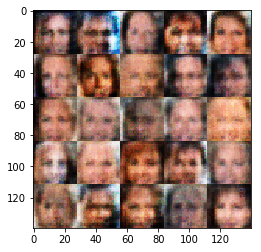

Epoch 1/10... Discriminator Loss: 1.4150... Generator Loss: 0.6826
Epoch 1/10... Discriminator Loss: 1.4257... Generator Loss: 0.6823
Epoch 1/10... Discriminator Loss: 1.4044... Generator Loss: 0.6891
Epoch 1/10... Discriminator Loss: 1.4546... Generator Loss: 0.6389
Epoch 1/10... Discriminator Loss: 1.4675... Generator Loss: 0.6465
Epoch 1/10... Discriminator Loss: 1.4546... Generator Loss: 0.6500
Epoch 1/10... Discriminator Loss: 1.4719... Generator Loss: 0.6098
Epoch 1/10... Discriminator Loss: 1.4122... Generator Loss: 0.6977
Epoch 1/10... Discriminator Loss: 1.4028... Generator Loss: 0.6946
Epoch 1/10... Discriminator Loss: 1.4132... Generator Loss: 0.6945


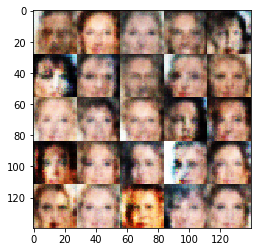

Epoch 1/10... Discriminator Loss: 1.4921... Generator Loss: 0.6475
Epoch 1/10... Discriminator Loss: 1.3817... Generator Loss: 0.6928
Epoch 1/10... Discriminator Loss: 1.4595... Generator Loss: 0.6701
Epoch 1/10... Discriminator Loss: 1.4019... Generator Loss: 0.6759
Epoch 1/10... Discriminator Loss: 1.4543... Generator Loss: 0.6994
Epoch 1/10... Discriminator Loss: 1.5204... Generator Loss: 0.5825
Epoch 1/10... Discriminator Loss: 1.4316... Generator Loss: 0.7078
Epoch 1/10... Discriminator Loss: 1.3880... Generator Loss: 0.6890
Epoch 1/10... Discriminator Loss: 1.4180... Generator Loss: 0.6728
Epoch 1/10... Discriminator Loss: 1.4711... Generator Loss: 0.6601


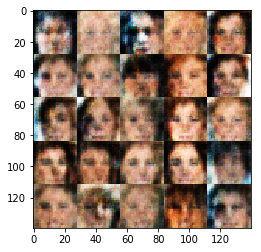

Epoch 1/10... Discriminator Loss: 1.4443... Generator Loss: 0.6614
Epoch 1/10... Discriminator Loss: 1.4579... Generator Loss: 0.6956
Epoch 1/10... Discriminator Loss: 1.4883... Generator Loss: 0.6814
Epoch 1/10... Discriminator Loss: 1.4835... Generator Loss: 0.7027
Epoch 1/10... Discriminator Loss: 1.5098... Generator Loss: 0.6379
Epoch 1/10... Discriminator Loss: 1.4415... Generator Loss: 0.6241
Epoch 1/10... Discriminator Loss: 1.3771... Generator Loss: 0.6652
Epoch 1/10... Discriminator Loss: 1.4997... Generator Loss: 0.6070
Epoch 1/10... Discriminator Loss: 1.4754... Generator Loss: 0.6199
Epoch 1/10... Discriminator Loss: 1.3523... Generator Loss: 0.7175


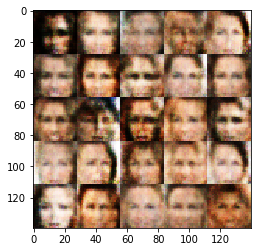

Epoch 1/10... Discriminator Loss: 1.4803... Generator Loss: 0.6547
Epoch 1/10... Discriminator Loss: 1.4518... Generator Loss: 0.6110
Epoch 1/10... Discriminator Loss: 1.3957... Generator Loss: 0.6903
Epoch 1/10... Discriminator Loss: 1.4231... Generator Loss: 0.6981
Epoch 1/10... Discriminator Loss: 1.4960... Generator Loss: 0.6384
Epoch 1/10... Discriminator Loss: 1.4538... Generator Loss: 0.6965
Epoch 1/10... Discriminator Loss: 1.4515... Generator Loss: 0.6898
Epoch 1/10... Discriminator Loss: 1.4064... Generator Loss: 0.7181
Epoch 1/10... Discriminator Loss: 1.4730... Generator Loss: 0.6283
Epoch 1/10... Discriminator Loss: 1.4303... Generator Loss: 0.7030


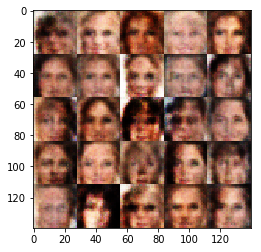

Epoch 1/10... Discriminator Loss: 1.4442... Generator Loss: 0.7018
Epoch 1/10... Discriminator Loss: 1.4832... Generator Loss: 0.6884
Epoch 1/10... Discriminator Loss: 1.4443... Generator Loss: 0.7055
Epoch 1/10... Discriminator Loss: 1.4410... Generator Loss: 0.6852
Epoch 1/10... Discriminator Loss: 1.4315... Generator Loss: 0.6964
Epoch 1/10... Discriminator Loss: 1.4559... Generator Loss: 0.7154
Epoch 1/10... Discriminator Loss: 1.4649... Generator Loss: 0.6650
Epoch 1/10... Discriminator Loss: 1.4911... Generator Loss: 0.6608
Epoch 1/10... Discriminator Loss: 1.4201... Generator Loss: 0.6380
Epoch 1/10... Discriminator Loss: 1.4367... Generator Loss: 0.6625


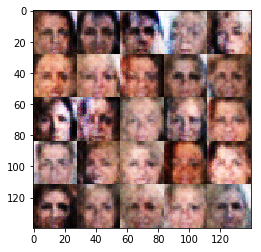

Epoch 1/10... Discriminator Loss: 1.4015... Generator Loss: 0.6699
Epoch 1/10... Discriminator Loss: 1.4685... Generator Loss: 0.6497
Epoch 1/10... Discriminator Loss: 1.4308... Generator Loss: 0.6581
Epoch 1/10... Discriminator Loss: 1.4388... Generator Loss: 0.6742
Epoch 1/10... Discriminator Loss: 1.4654... Generator Loss: 0.7082
Epoch 1/10... Discriminator Loss: 1.4672... Generator Loss: 0.6105
Epoch 1/10... Discriminator Loss: 1.4267... Generator Loss: 0.6561
Epoch 1/10... Discriminator Loss: 1.4821... Generator Loss: 0.6561
Epoch 1/10... Discriminator Loss: 1.3724... Generator Loss: 0.6880
Epoch 1/10... Discriminator Loss: 1.4086... Generator Loss: 0.6549


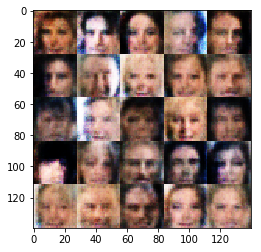

Epoch 1/10... Discriminator Loss: 1.4364... Generator Loss: 0.6533
Epoch 1/10... Discriminator Loss: 1.4241... Generator Loss: 0.7108
Epoch 1/10... Discriminator Loss: 1.4985... Generator Loss: 0.6254
Epoch 1/10... Discriminator Loss: 1.5021... Generator Loss: 0.6289
Epoch 1/10... Discriminator Loss: 1.4641... Generator Loss: 0.6477
Epoch 1/10... Discriminator Loss: 1.4090... Generator Loss: 0.6271
Epoch 1/10... Discriminator Loss: 1.4626... Generator Loss: 0.6835
Epoch 1/10... Discriminator Loss: 1.4185... Generator Loss: 0.7069
Epoch 1/10... Discriminator Loss: 1.4257... Generator Loss: 0.6773
Epoch 1/10... Discriminator Loss: 1.4566... Generator Loss: 0.6665


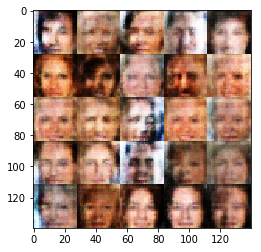

Epoch 1/10... Discriminator Loss: 1.4740... Generator Loss: 0.6718
Epoch 1/10... Discriminator Loss: 1.4495... Generator Loss: 0.6326
Epoch 1/10... Discriminator Loss: 1.4139... Generator Loss: 0.6778
Epoch 1/10... Discriminator Loss: 1.4334... Generator Loss: 0.6586
Epoch 1/10... Discriminator Loss: 1.4493... Generator Loss: 0.6406
Epoch 1/10... Discriminator Loss: 1.4500... Generator Loss: 0.6602
Epoch 1/10... Discriminator Loss: 1.3599... Generator Loss: 0.6730
Epoch 1/10... Discriminator Loss: 1.4575... Generator Loss: 0.6455
Epoch 1/10... Discriminator Loss: 1.4503... Generator Loss: 0.6915
Epoch 1/10... Discriminator Loss: 1.4373... Generator Loss: 0.6719


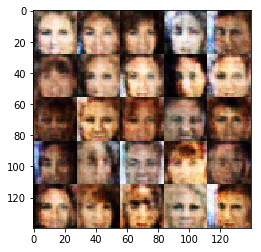

Epoch 1/10... Discriminator Loss: 1.4302... Generator Loss: 0.6539
Epoch 1/10... Discriminator Loss: 1.3957... Generator Loss: 0.6945
Epoch 1/10... Discriminator Loss: 1.4483... Generator Loss: 0.7063
Epoch 1/10... Discriminator Loss: 1.4263... Generator Loss: 0.6995
Epoch 1/10... Discriminator Loss: 1.4341... Generator Loss: 0.6665
Epoch 1/10... Discriminator Loss: 1.4205... Generator Loss: 0.6707
Epoch 1/10... Discriminator Loss: 1.4186... Generator Loss: 0.6552
Epoch 1/10... Discriminator Loss: 1.4223... Generator Loss: 0.6661
Epoch 2/10... Discriminator Loss: 1.4009... Generator Loss: 0.7004
Epoch 2/10... Discriminator Loss: 1.3901... Generator Loss: 0.6903


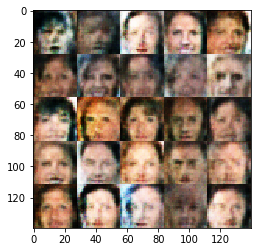

Epoch 2/10... Discriminator Loss: 1.4377... Generator Loss: 0.7324
Epoch 2/10... Discriminator Loss: 1.4842... Generator Loss: 0.6388
Epoch 2/10... Discriminator Loss: 1.4090... Generator Loss: 0.6601
Epoch 2/10... Discriminator Loss: 1.4477... Generator Loss: 0.6800
Epoch 2/10... Discriminator Loss: 1.4906... Generator Loss: 0.6355
Epoch 2/10... Discriminator Loss: 1.4500... Generator Loss: 0.6710
Epoch 2/10... Discriminator Loss: 1.4420... Generator Loss: 0.6796
Epoch 2/10... Discriminator Loss: 1.4341... Generator Loss: 0.6938
Epoch 2/10... Discriminator Loss: 1.4585... Generator Loss: 0.6198
Epoch 2/10... Discriminator Loss: 1.4236... Generator Loss: 0.6677


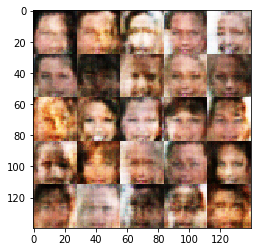

Epoch 2/10... Discriminator Loss: 1.3828... Generator Loss: 0.6764
Epoch 2/10... Discriminator Loss: 1.4533... Generator Loss: 0.6892
Epoch 2/10... Discriminator Loss: 1.4086... Generator Loss: 0.6633
Epoch 2/10... Discriminator Loss: 1.4159... Generator Loss: 0.6736
Epoch 2/10... Discriminator Loss: 1.4524... Generator Loss: 0.6587
Epoch 2/10... Discriminator Loss: 1.4373... Generator Loss: 0.6933
Epoch 2/10... Discriminator Loss: 1.4417... Generator Loss: 0.6542
Epoch 2/10... Discriminator Loss: 1.4328... Generator Loss: 0.6613
Epoch 2/10... Discriminator Loss: 1.3836... Generator Loss: 0.6997
Epoch 2/10... Discriminator Loss: 1.4137... Generator Loss: 0.7189


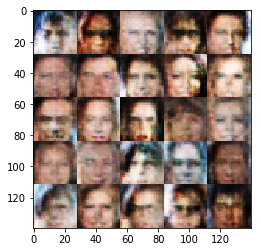

Epoch 2/10... Discriminator Loss: 1.3966... Generator Loss: 0.6783
Epoch 2/10... Discriminator Loss: 1.4877... Generator Loss: 0.6512
Epoch 2/10... Discriminator Loss: 1.4903... Generator Loss: 0.6965
Epoch 2/10... Discriminator Loss: 1.5546... Generator Loss: 0.5982
Epoch 2/10... Discriminator Loss: 1.4560... Generator Loss: 0.6730
Epoch 2/10... Discriminator Loss: 1.4342... Generator Loss: 0.6530
Epoch 2/10... Discriminator Loss: 1.4530... Generator Loss: 0.6702
Epoch 2/10... Discriminator Loss: 1.4058... Generator Loss: 0.6606
Epoch 2/10... Discriminator Loss: 1.4702... Generator Loss: 0.6616
Epoch 2/10... Discriminator Loss: 1.3474... Generator Loss: 0.7289


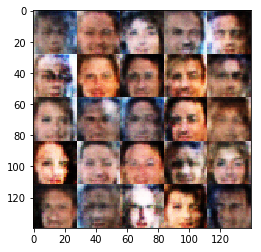

Epoch 2/10... Discriminator Loss: 1.4342... Generator Loss: 0.6536
Epoch 2/10... Discriminator Loss: 1.4130... Generator Loss: 0.6634
Epoch 2/10... Discriminator Loss: 1.4586... Generator Loss: 0.6654
Epoch 2/10... Discriminator Loss: 1.4221... Generator Loss: 0.6812
Epoch 2/10... Discriminator Loss: 1.4297... Generator Loss: 0.6761
Epoch 2/10... Discriminator Loss: 1.4134... Generator Loss: 0.7060
Epoch 2/10... Discriminator Loss: 1.3956... Generator Loss: 0.7013
Epoch 2/10... Discriminator Loss: 1.4372... Generator Loss: 0.7121
Epoch 2/10... Discriminator Loss: 1.4003... Generator Loss: 0.6745
Epoch 2/10... Discriminator Loss: 1.4025... Generator Loss: 0.6457


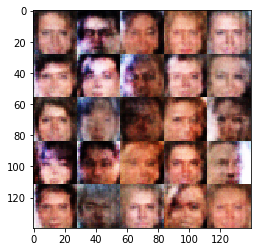

Epoch 2/10... Discriminator Loss: 1.3871... Generator Loss: 0.7274
Epoch 2/10... Discriminator Loss: 1.4361... Generator Loss: 0.6843
Epoch 2/10... Discriminator Loss: 1.4812... Generator Loss: 0.6562
Epoch 2/10... Discriminator Loss: 1.4922... Generator Loss: 0.6049
Epoch 2/10... Discriminator Loss: 1.4383... Generator Loss: 0.6615
Epoch 2/10... Discriminator Loss: 1.4038... Generator Loss: 0.6864
Epoch 2/10... Discriminator Loss: 1.4385... Generator Loss: 0.6623
Epoch 2/10... Discriminator Loss: 1.4035... Generator Loss: 0.6844
Epoch 2/10... Discriminator Loss: 1.4203... Generator Loss: 0.6987
Epoch 2/10... Discriminator Loss: 1.4308... Generator Loss: 0.6633


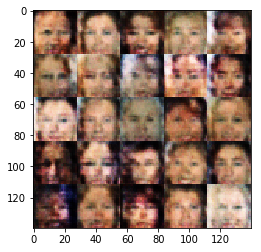

Epoch 2/10... Discriminator Loss: 1.4100... Generator Loss: 0.6710
Epoch 2/10... Discriminator Loss: 1.4492... Generator Loss: 0.6668
Epoch 2/10... Discriminator Loss: 1.4523... Generator Loss: 0.6507
Epoch 2/10... Discriminator Loss: 1.4515... Generator Loss: 0.6827
Epoch 2/10... Discriminator Loss: 1.4238... Generator Loss: 0.6803
Epoch 2/10... Discriminator Loss: 1.4153... Generator Loss: 0.7202
Epoch 2/10... Discriminator Loss: 1.4327... Generator Loss: 0.6656
Epoch 2/10... Discriminator Loss: 1.4157... Generator Loss: 0.7104
Epoch 2/10... Discriminator Loss: 1.4449... Generator Loss: 0.6622
Epoch 2/10... Discriminator Loss: 1.4307... Generator Loss: 0.6832


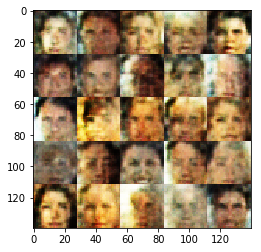

Epoch 2/10... Discriminator Loss: 1.3992... Generator Loss: 0.6683
Epoch 2/10... Discriminator Loss: 1.4367... Generator Loss: 0.6679
Epoch 2/10... Discriminator Loss: 1.5146... Generator Loss: 0.6691
Epoch 2/10... Discriminator Loss: 1.4208... Generator Loss: 0.6774
Epoch 2/10... Discriminator Loss: 1.4398... Generator Loss: 0.6341
Epoch 2/10... Discriminator Loss: 1.4567... Generator Loss: 0.6328
Epoch 2/10... Discriminator Loss: 1.3908... Generator Loss: 0.7089
Epoch 2/10... Discriminator Loss: 1.4486... Generator Loss: 0.6437
Epoch 2/10... Discriminator Loss: 1.4668... Generator Loss: 0.6678
Epoch 2/10... Discriminator Loss: 1.4491... Generator Loss: 0.6665


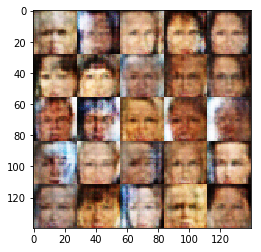

Epoch 2/10... Discriminator Loss: 1.3936... Generator Loss: 0.6573
Epoch 2/10... Discriminator Loss: 1.4322... Generator Loss: 0.6534
Epoch 2/10... Discriminator Loss: 1.4417... Generator Loss: 0.6643
Epoch 2/10... Discriminator Loss: 1.4427... Generator Loss: 0.6739
Epoch 2/10... Discriminator Loss: 1.4794... Generator Loss: 0.6281
Epoch 2/10... Discriminator Loss: 1.4300... Generator Loss: 0.6624
Epoch 2/10... Discriminator Loss: 1.4085... Generator Loss: 0.6801
Epoch 2/10... Discriminator Loss: 1.4387... Generator Loss: 0.6429
Epoch 2/10... Discriminator Loss: 1.4418... Generator Loss: 0.6748
Epoch 2/10... Discriminator Loss: 1.4011... Generator Loss: 0.7350


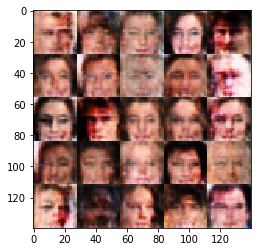

Epoch 2/10... Discriminator Loss: 1.3950... Generator Loss: 0.6756
Epoch 2/10... Discriminator Loss: 1.3939... Generator Loss: 0.6650
Epoch 2/10... Discriminator Loss: 1.3844... Generator Loss: 0.6943
Epoch 2/10... Discriminator Loss: 1.4249... Generator Loss: 0.7037
Epoch 2/10... Discriminator Loss: 1.4291... Generator Loss: 0.6730
Epoch 2/10... Discriminator Loss: 1.3917... Generator Loss: 0.6944
Epoch 2/10... Discriminator Loss: 1.4604... Generator Loss: 0.6847
Epoch 2/10... Discriminator Loss: 1.3904... Generator Loss: 0.7114
Epoch 2/10... Discriminator Loss: 1.4337... Generator Loss: 0.6896
Epoch 2/10... Discriminator Loss: 1.4270... Generator Loss: 0.6698


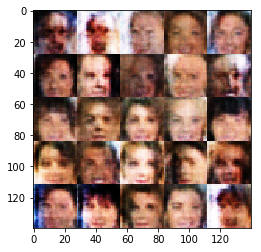

Epoch 2/10... Discriminator Loss: 1.4093... Generator Loss: 0.6291
Epoch 2/10... Discriminator Loss: 1.3903... Generator Loss: 0.7166
Epoch 2/10... Discriminator Loss: 1.3608... Generator Loss: 0.7139
Epoch 2/10... Discriminator Loss: 1.4222... Generator Loss: 0.6645
Epoch 2/10... Discriminator Loss: 1.4114... Generator Loss: 0.7146
Epoch 2/10... Discriminator Loss: 1.4309... Generator Loss: 0.6635
Epoch 2/10... Discriminator Loss: 1.4098... Generator Loss: 0.7131
Epoch 2/10... Discriminator Loss: 1.4158... Generator Loss: 0.6771
Epoch 2/10... Discriminator Loss: 1.3949... Generator Loss: 0.6971
Epoch 2/10... Discriminator Loss: 1.4474... Generator Loss: 0.7188


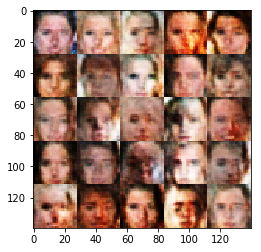

Epoch 2/10... Discriminator Loss: 1.3906... Generator Loss: 0.7009
Epoch 2/10... Discriminator Loss: 1.3962... Generator Loss: 0.6755
Epoch 2/10... Discriminator Loss: 1.3915... Generator Loss: 0.6862
Epoch 2/10... Discriminator Loss: 1.3799... Generator Loss: 0.6974
Epoch 2/10... Discriminator Loss: 1.4287... Generator Loss: 0.7018
Epoch 2/10... Discriminator Loss: 1.4052... Generator Loss: 0.6913
Epoch 2/10... Discriminator Loss: 1.4368... Generator Loss: 0.6646
Epoch 2/10... Discriminator Loss: 1.4275... Generator Loss: 0.6470
Epoch 2/10... Discriminator Loss: 1.4027... Generator Loss: 0.6495
Epoch 2/10... Discriminator Loss: 1.4220... Generator Loss: 0.6591


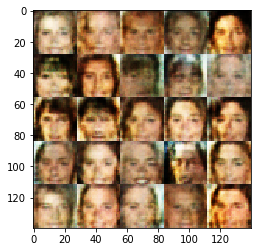

Epoch 2/10... Discriminator Loss: 1.3907... Generator Loss: 0.6323
Epoch 2/10... Discriminator Loss: 1.3942... Generator Loss: 0.7107
Epoch 2/10... Discriminator Loss: 1.4144... Generator Loss: 0.6582
Epoch 2/10... Discriminator Loss: 1.4234... Generator Loss: 0.6565
Epoch 2/10... Discriminator Loss: 1.3928... Generator Loss: 0.6798
Epoch 2/10... Discriminator Loss: 1.4150... Generator Loss: 0.7120
Epoch 2/10... Discriminator Loss: 1.4010... Generator Loss: 0.6956
Epoch 2/10... Discriminator Loss: 1.4164... Generator Loss: 0.6848
Epoch 2/10... Discriminator Loss: 1.4127... Generator Loss: 0.6990
Epoch 2/10... Discriminator Loss: 1.4074... Generator Loss: 0.6626


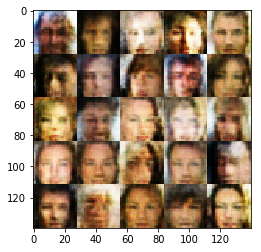

Epoch 2/10... Discriminator Loss: 1.4282... Generator Loss: 0.7042
Epoch 2/10... Discriminator Loss: 1.3898... Generator Loss: 0.6881
Epoch 2/10... Discriminator Loss: 1.4426... Generator Loss: 0.6073
Epoch 2/10... Discriminator Loss: 1.4172... Generator Loss: 0.6652
Epoch 2/10... Discriminator Loss: 1.4416... Generator Loss: 0.7020
Epoch 2/10... Discriminator Loss: 1.4090... Generator Loss: 0.6718
Epoch 2/10... Discriminator Loss: 1.4138... Generator Loss: 0.6828
Epoch 2/10... Discriminator Loss: 1.4493... Generator Loss: 0.6721
Epoch 2/10... Discriminator Loss: 1.4198... Generator Loss: 0.6888
Epoch 2/10... Discriminator Loss: 1.4455... Generator Loss: 0.6576


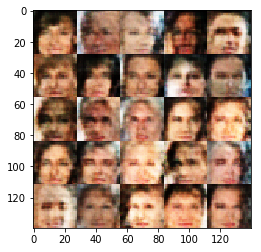

Epoch 2/10... Discriminator Loss: 1.4374... Generator Loss: 0.6721
Epoch 2/10... Discriminator Loss: 1.4214... Generator Loss: 0.6829
Epoch 2/10... Discriminator Loss: 1.4223... Generator Loss: 0.6664
Epoch 2/10... Discriminator Loss: 1.3848... Generator Loss: 0.6736
Epoch 2/10... Discriminator Loss: 1.4021... Generator Loss: 0.6370
Epoch 2/10... Discriminator Loss: 1.4414... Generator Loss: 0.6792
Epoch 2/10... Discriminator Loss: 1.3936... Generator Loss: 0.6857
Epoch 2/10... Discriminator Loss: 1.4182... Generator Loss: 0.6934
Epoch 2/10... Discriminator Loss: 1.4499... Generator Loss: 0.6404
Epoch 2/10... Discriminator Loss: 1.4231... Generator Loss: 0.6993


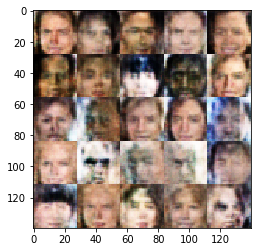

Epoch 2/10... Discriminator Loss: 1.4348... Generator Loss: 0.6413
Epoch 2/10... Discriminator Loss: 1.4440... Generator Loss: 0.6555
Epoch 2/10... Discriminator Loss: 1.4162... Generator Loss: 0.7027
Epoch 2/10... Discriminator Loss: 1.4052... Generator Loss: 0.7026
Epoch 2/10... Discriminator Loss: 1.4169... Generator Loss: 0.6304
Epoch 2/10... Discriminator Loss: 1.4418... Generator Loss: 0.6674
Epoch 2/10... Discriminator Loss: 1.4294... Generator Loss: 0.6538
Epoch 2/10... Discriminator Loss: 1.4144... Generator Loss: 0.6628
Epoch 2/10... Discriminator Loss: 1.4204... Generator Loss: 0.6827
Epoch 2/10... Discriminator Loss: 1.4063... Generator Loss: 0.6912


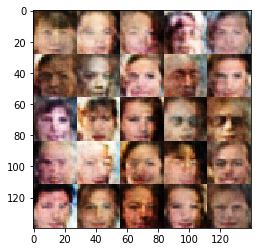

Epoch 2/10... Discriminator Loss: 1.4164... Generator Loss: 0.7068
Epoch 2/10... Discriminator Loss: 1.4529... Generator Loss: 0.6314
Epoch 2/10... Discriminator Loss: 1.3977... Generator Loss: 0.6683
Epoch 2/10... Discriminator Loss: 1.4053... Generator Loss: 0.6868
Epoch 2/10... Discriminator Loss: 1.4346... Generator Loss: 0.6955
Epoch 2/10... Discriminator Loss: 1.4549... Generator Loss: 0.6338
Epoch 3/10... Discriminator Loss: 1.4481... Generator Loss: 0.6637
Epoch 3/10... Discriminator Loss: 1.4350... Generator Loss: 0.7003
Epoch 3/10... Discriminator Loss: 1.4199... Generator Loss: 0.6610
Epoch 3/10... Discriminator Loss: 1.4350... Generator Loss: 0.6797


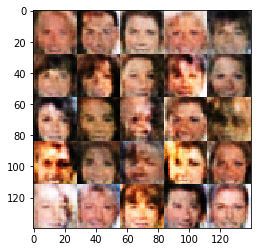

Epoch 3/10... Discriminator Loss: 1.3996... Generator Loss: 0.6511
Epoch 3/10... Discriminator Loss: 1.3868... Generator Loss: 0.6836
Epoch 3/10... Discriminator Loss: 1.4290... Generator Loss: 0.6758
Epoch 3/10... Discriminator Loss: 1.4023... Generator Loss: 0.6742
Epoch 3/10... Discriminator Loss: 1.4415... Generator Loss: 0.6517
Epoch 3/10... Discriminator Loss: 1.4434... Generator Loss: 0.6729
Epoch 3/10... Discriminator Loss: 1.4168... Generator Loss: 0.6733
Epoch 3/10... Discriminator Loss: 1.3886... Generator Loss: 0.6945
Epoch 3/10... Discriminator Loss: 1.4036... Generator Loss: 0.7033
Epoch 3/10... Discriminator Loss: 1.4636... Generator Loss: 0.6510


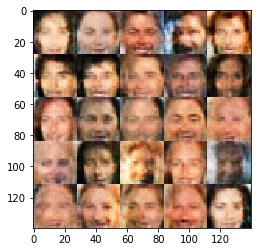

Epoch 3/10... Discriminator Loss: 1.4336... Generator Loss: 0.6420
Epoch 3/10... Discriminator Loss: 1.4105... Generator Loss: 0.7084
Epoch 3/10... Discriminator Loss: 1.4433... Generator Loss: 0.6805
Epoch 3/10... Discriminator Loss: 1.4394... Generator Loss: 0.6617
Epoch 3/10... Discriminator Loss: 1.4143... Generator Loss: 0.6826
Epoch 3/10... Discriminator Loss: 1.4113... Generator Loss: 0.6594
Epoch 3/10... Discriminator Loss: 1.4261... Generator Loss: 0.6908
Epoch 3/10... Discriminator Loss: 1.4239... Generator Loss: 0.6683
Epoch 3/10... Discriminator Loss: 1.4382... Generator Loss: 0.6857
Epoch 3/10... Discriminator Loss: 1.4004... Generator Loss: 0.6867


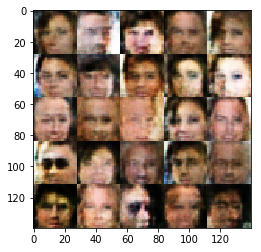

Epoch 3/10... Discriminator Loss: 1.4151... Generator Loss: 0.6404
Epoch 3/10... Discriminator Loss: 1.4251... Generator Loss: 0.6519
Epoch 3/10... Discriminator Loss: 1.4010... Generator Loss: 0.6402
Epoch 3/10... Discriminator Loss: 1.4215... Generator Loss: 0.6935
Epoch 3/10... Discriminator Loss: 1.3918... Generator Loss: 0.6473
Epoch 3/10... Discriminator Loss: 1.4215... Generator Loss: 0.6948
Epoch 3/10... Discriminator Loss: 1.3958... Generator Loss: 0.7116
Epoch 3/10... Discriminator Loss: 1.4196... Generator Loss: 0.7243
Epoch 3/10... Discriminator Loss: 1.3948... Generator Loss: 0.6867
Epoch 3/10... Discriminator Loss: 1.4122... Generator Loss: 0.7005


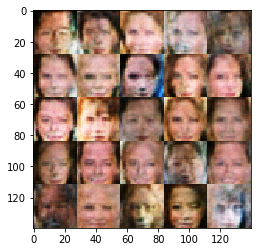

Epoch 3/10... Discriminator Loss: 1.4195... Generator Loss: 0.6696
Epoch 3/10... Discriminator Loss: 1.4613... Generator Loss: 0.6565
Epoch 3/10... Discriminator Loss: 1.4230... Generator Loss: 0.6514
Epoch 3/10... Discriminator Loss: 1.4153... Generator Loss: 0.6813
Epoch 3/10... Discriminator Loss: 1.4070... Generator Loss: 0.6935
Epoch 3/10... Discriminator Loss: 1.4345... Generator Loss: 0.6926
Epoch 3/10... Discriminator Loss: 1.4312... Generator Loss: 0.6612
Epoch 3/10... Discriminator Loss: 1.4087... Generator Loss: 0.6966
Epoch 3/10... Discriminator Loss: 1.4295... Generator Loss: 0.6688
Epoch 3/10... Discriminator Loss: 1.3831... Generator Loss: 0.7238


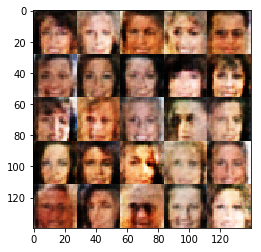

Epoch 3/10... Discriminator Loss: 1.4306... Generator Loss: 0.6299
Epoch 3/10... Discriminator Loss: 1.4232... Generator Loss: 0.7232
Epoch 3/10... Discriminator Loss: 1.4042... Generator Loss: 0.6810
Epoch 3/10... Discriminator Loss: 1.3832... Generator Loss: 0.6903
Epoch 3/10... Discriminator Loss: 1.3781... Generator Loss: 0.6984
Epoch 3/10... Discriminator Loss: 1.4675... Generator Loss: 0.6344
Epoch 3/10... Discriminator Loss: 1.4145... Generator Loss: 0.6883
Epoch 3/10... Discriminator Loss: 1.4160... Generator Loss: 0.6693
Epoch 3/10... Discriminator Loss: 1.3973... Generator Loss: 0.6691
Epoch 3/10... Discriminator Loss: 1.4562... Generator Loss: 0.6363


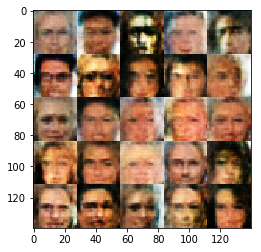

Epoch 3/10... Discriminator Loss: 1.4272... Generator Loss: 0.6434
Epoch 3/10... Discriminator Loss: 1.4540... Generator Loss: 0.6558
Epoch 3/10... Discriminator Loss: 1.4509... Generator Loss: 0.6657
Epoch 3/10... Discriminator Loss: 1.4056... Generator Loss: 0.6736
Epoch 3/10... Discriminator Loss: 1.3966... Generator Loss: 0.6518
Epoch 3/10... Discriminator Loss: 1.3958... Generator Loss: 0.6928
Epoch 3/10... Discriminator Loss: 1.3958... Generator Loss: 0.6897
Epoch 3/10... Discriminator Loss: 1.4462... Generator Loss: 0.6908
Epoch 3/10... Discriminator Loss: 1.4113... Generator Loss: 0.6646
Epoch 3/10... Discriminator Loss: 1.4273... Generator Loss: 0.6661


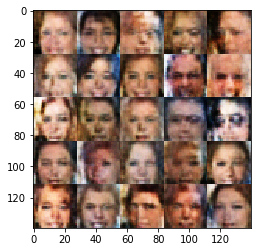

Epoch 3/10... Discriminator Loss: 1.4223... Generator Loss: 0.6580
Epoch 3/10... Discriminator Loss: 1.4402... Generator Loss: 0.6268
Epoch 3/10... Discriminator Loss: 1.4031... Generator Loss: 0.6688
Epoch 3/10... Discriminator Loss: 1.4145... Generator Loss: 0.6615
Epoch 3/10... Discriminator Loss: 1.4048... Generator Loss: 0.6786
Epoch 3/10... Discriminator Loss: 1.3919... Generator Loss: 0.6851
Epoch 3/10... Discriminator Loss: 1.4500... Generator Loss: 0.6966
Epoch 3/10... Discriminator Loss: 1.4008... Generator Loss: 0.7028
Epoch 3/10... Discriminator Loss: 1.4265... Generator Loss: 0.6698
Epoch 3/10... Discriminator Loss: 1.4175... Generator Loss: 0.6753


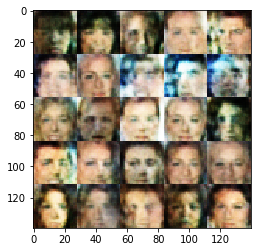

Epoch 3/10... Discriminator Loss: 1.4331... Generator Loss: 0.6958
Epoch 3/10... Discriminator Loss: 1.4010... Generator Loss: 0.6360
Epoch 3/10... Discriminator Loss: 1.4144... Generator Loss: 0.6941
Epoch 3/10... Discriminator Loss: 1.4170... Generator Loss: 0.7096
Epoch 3/10... Discriminator Loss: 1.4050... Generator Loss: 0.6577
Epoch 3/10... Discriminator Loss: 1.3910... Generator Loss: 0.6947
Epoch 3/10... Discriminator Loss: 1.3929... Generator Loss: 0.7168
Epoch 3/10... Discriminator Loss: 1.4106... Generator Loss: 0.6574
Epoch 3/10... Discriminator Loss: 1.3889... Generator Loss: 0.6802
Epoch 3/10... Discriminator Loss: 1.4000... Generator Loss: 0.6897


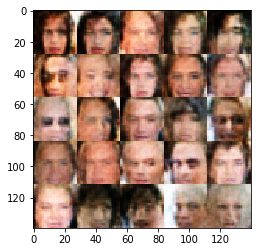

Epoch 3/10... Discriminator Loss: 1.4106... Generator Loss: 0.6844
Epoch 3/10... Discriminator Loss: 1.4213... Generator Loss: 0.6525
Epoch 3/10... Discriminator Loss: 1.4226... Generator Loss: 0.6493
Epoch 3/10... Discriminator Loss: 1.4483... Generator Loss: 0.6291
Epoch 3/10... Discriminator Loss: 1.4208... Generator Loss: 0.6950
Epoch 3/10... Discriminator Loss: 1.4286... Generator Loss: 0.6471
Epoch 3/10... Discriminator Loss: 1.4190... Generator Loss: 0.6806
Epoch 3/10... Discriminator Loss: 1.3988... Generator Loss: 0.6601
Epoch 3/10... Discriminator Loss: 1.4188... Generator Loss: 0.6696
Epoch 3/10... Discriminator Loss: 1.4031... Generator Loss: 0.6478


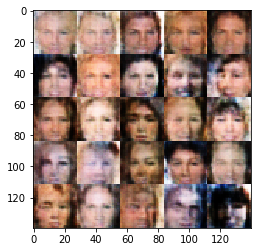

Epoch 3/10... Discriminator Loss: 1.4293... Generator Loss: 0.6604
Epoch 3/10... Discriminator Loss: 1.4236... Generator Loss: 0.7129
Epoch 3/10... Discriminator Loss: 1.4062... Generator Loss: 0.6689
Epoch 3/10... Discriminator Loss: 1.4030... Generator Loss: 0.6560
Epoch 3/10... Discriminator Loss: 1.4182... Generator Loss: 0.6757
Epoch 3/10... Discriminator Loss: 1.4060... Generator Loss: 0.6732
Epoch 3/10... Discriminator Loss: 1.3990... Generator Loss: 0.6843
Epoch 3/10... Discriminator Loss: 1.4209... Generator Loss: 0.6698
Epoch 3/10... Discriminator Loss: 1.4004... Generator Loss: 0.6962
Epoch 3/10... Discriminator Loss: 1.4172... Generator Loss: 0.6717


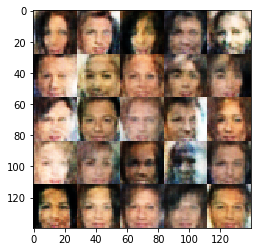

Epoch 3/10... Discriminator Loss: 1.4096... Generator Loss: 0.7072
Epoch 3/10... Discriminator Loss: 1.4148... Generator Loss: 0.6646
Epoch 3/10... Discriminator Loss: 1.4019... Generator Loss: 0.6537
Epoch 3/10... Discriminator Loss: 1.4014... Generator Loss: 0.7083
Epoch 3/10... Discriminator Loss: 1.4555... Generator Loss: 0.6896
Epoch 3/10... Discriminator Loss: 1.4054... Generator Loss: 0.6993
Epoch 3/10... Discriminator Loss: 1.4131... Generator Loss: 0.6661
Epoch 3/10... Discriminator Loss: 1.4200... Generator Loss: 0.6490
Epoch 3/10... Discriminator Loss: 1.4607... Generator Loss: 0.6796
Epoch 3/10... Discriminator Loss: 1.4340... Generator Loss: 0.6529


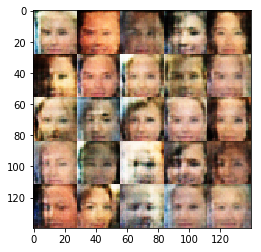

Epoch 3/10... Discriminator Loss: 1.4014... Generator Loss: 0.7242
Epoch 3/10... Discriminator Loss: 1.3975... Generator Loss: 0.6989
Epoch 3/10... Discriminator Loss: 1.4086... Generator Loss: 0.6965
Epoch 3/10... Discriminator Loss: 1.3883... Generator Loss: 0.6583
Epoch 3/10... Discriminator Loss: 1.4047... Generator Loss: 0.6838
Epoch 3/10... Discriminator Loss: 1.3911... Generator Loss: 0.6759
Epoch 3/10... Discriminator Loss: 1.3867... Generator Loss: 0.6569
Epoch 3/10... Discriminator Loss: 1.3856... Generator Loss: 0.6878
Epoch 3/10... Discriminator Loss: 1.3996... Generator Loss: 0.6574
Epoch 3/10... Discriminator Loss: 1.4027... Generator Loss: 0.6829


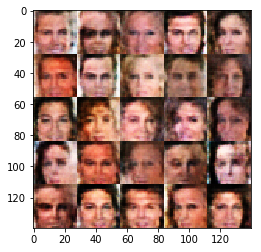

Epoch 3/10... Discriminator Loss: 1.4235... Generator Loss: 0.6630
Epoch 3/10... Discriminator Loss: 1.4189... Generator Loss: 0.6920
Epoch 3/10... Discriminator Loss: 1.4185... Generator Loss: 0.6578
Epoch 3/10... Discriminator Loss: 1.4189... Generator Loss: 0.7028
Epoch 3/10... Discriminator Loss: 1.4024... Generator Loss: 0.6921
Epoch 3/10... Discriminator Loss: 1.4220... Generator Loss: 0.6523
Epoch 3/10... Discriminator Loss: 1.3702... Generator Loss: 0.6885
Epoch 3/10... Discriminator Loss: 1.4122... Generator Loss: 0.6553
Epoch 3/10... Discriminator Loss: 1.4145... Generator Loss: 0.6532
Epoch 3/10... Discriminator Loss: 1.3971... Generator Loss: 0.6988


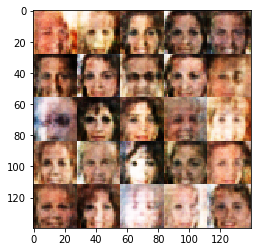

Epoch 3/10... Discriminator Loss: 1.3931... Generator Loss: 0.6822
Epoch 3/10... Discriminator Loss: 1.4085... Generator Loss: 0.7059
Epoch 3/10... Discriminator Loss: 1.4419... Generator Loss: 0.6911
Epoch 3/10... Discriminator Loss: 1.4402... Generator Loss: 0.6654
Epoch 3/10... Discriminator Loss: 1.3773... Generator Loss: 0.6760
Epoch 3/10... Discriminator Loss: 1.4580... Generator Loss: 0.6354
Epoch 3/10... Discriminator Loss: 1.4425... Generator Loss: 0.6568
Epoch 3/10... Discriminator Loss: 1.4215... Generator Loss: 0.6719
Epoch 3/10... Discriminator Loss: 1.4357... Generator Loss: 0.7131
Epoch 3/10... Discriminator Loss: 1.4093... Generator Loss: 0.6659


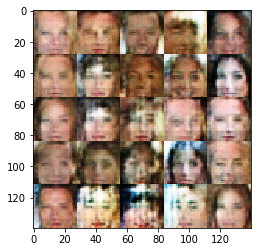

Epoch 3/10... Discriminator Loss: 1.3928... Generator Loss: 0.6660
Epoch 3/10... Discriminator Loss: 1.3975... Generator Loss: 0.6495
Epoch 3/10... Discriminator Loss: 1.4001... Generator Loss: 0.7074
Epoch 3/10... Discriminator Loss: 1.4235... Generator Loss: 0.6725
Epoch 3/10... Discriminator Loss: 1.4382... Generator Loss: 0.6730
Epoch 3/10... Discriminator Loss: 1.4205... Generator Loss: 0.6908
Epoch 3/10... Discriminator Loss: 1.4230... Generator Loss: 0.7282
Epoch 3/10... Discriminator Loss: 1.4050... Generator Loss: 0.6729
Epoch 3/10... Discriminator Loss: 1.4064... Generator Loss: 0.7081
Epoch 3/10... Discriminator Loss: 1.3964... Generator Loss: 0.6860


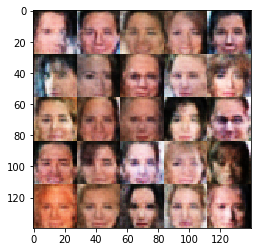

Epoch 3/10... Discriminator Loss: 1.4292... Generator Loss: 0.6703
Epoch 3/10... Discriminator Loss: 1.4059... Generator Loss: 0.6814
Epoch 3/10... Discriminator Loss: 1.4250... Generator Loss: 0.6752
Epoch 3/10... Discriminator Loss: 1.4097... Generator Loss: 0.6818
Epoch 4/10... Discriminator Loss: 1.4225... Generator Loss: 0.6525
Epoch 4/10... Discriminator Loss: 1.4061... Generator Loss: 0.6341
Epoch 4/10... Discriminator Loss: 1.4318... Generator Loss: 0.6276
Epoch 4/10... Discriminator Loss: 1.4144... Generator Loss: 0.6793
Epoch 4/10... Discriminator Loss: 1.3762... Generator Loss: 0.7129
Epoch 4/10... Discriminator Loss: 1.4182... Generator Loss: 0.6857


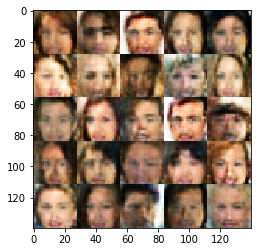

Epoch 4/10... Discriminator Loss: 1.4083... Generator Loss: 0.7121
Epoch 4/10... Discriminator Loss: 1.4001... Generator Loss: 0.7104
Epoch 4/10... Discriminator Loss: 1.4235... Generator Loss: 0.7092
Epoch 4/10... Discriminator Loss: 1.3981... Generator Loss: 0.6733
Epoch 4/10... Discriminator Loss: 1.3958... Generator Loss: 0.6777
Epoch 4/10... Discriminator Loss: 1.4116... Generator Loss: 0.6850
Epoch 4/10... Discriminator Loss: 1.4205... Generator Loss: 0.6479
Epoch 4/10... Discriminator Loss: 1.4096... Generator Loss: 0.6794
Epoch 4/10... Discriminator Loss: 1.4020... Generator Loss: 0.7317
Epoch 4/10... Discriminator Loss: 1.3857... Generator Loss: 0.6555


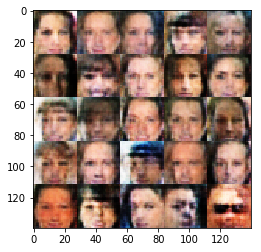

Epoch 4/10... Discriminator Loss: 1.3860... Generator Loss: 0.6894
Epoch 4/10... Discriminator Loss: 1.4132... Generator Loss: 0.6654
Epoch 4/10... Discriminator Loss: 1.4082... Generator Loss: 0.7031
Epoch 4/10... Discriminator Loss: 1.4348... Generator Loss: 0.7076
Epoch 4/10... Discriminator Loss: 1.4159... Generator Loss: 0.6792
Epoch 4/10... Discriminator Loss: 1.4518... Generator Loss: 0.6735
Epoch 4/10... Discriminator Loss: 1.3998... Generator Loss: 0.6623
Epoch 4/10... Discriminator Loss: 1.4306... Generator Loss: 0.6765
Epoch 4/10... Discriminator Loss: 1.4112... Generator Loss: 0.6618
Epoch 4/10... Discriminator Loss: 1.4049... Generator Loss: 0.6548


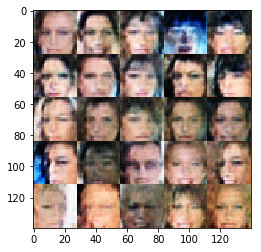

Epoch 4/10... Discriminator Loss: 1.4163... Generator Loss: 0.6980
Epoch 4/10... Discriminator Loss: 1.4018... Generator Loss: 0.6864
Epoch 4/10... Discriminator Loss: 1.3922... Generator Loss: 0.6690
Epoch 4/10... Discriminator Loss: 1.4049... Generator Loss: 0.6608
Epoch 4/10... Discriminator Loss: 1.4198... Generator Loss: 0.6607
Epoch 4/10... Discriminator Loss: 1.3968... Generator Loss: 0.6575
Epoch 4/10... Discriminator Loss: 1.4168... Generator Loss: 0.6510
Epoch 4/10... Discriminator Loss: 1.4131... Generator Loss: 0.6781
Epoch 4/10... Discriminator Loss: 1.4234... Generator Loss: 0.6695
Epoch 4/10... Discriminator Loss: 1.4049... Generator Loss: 0.6751


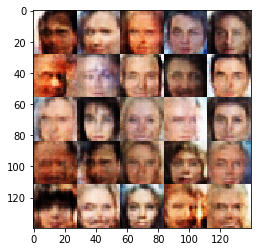

Epoch 4/10... Discriminator Loss: 1.4105... Generator Loss: 0.6868
Epoch 4/10... Discriminator Loss: 1.4086... Generator Loss: 0.6701
Epoch 4/10... Discriminator Loss: 1.4121... Generator Loss: 0.7133
Epoch 4/10... Discriminator Loss: 1.4037... Generator Loss: 0.6849
Epoch 4/10... Discriminator Loss: 1.3927... Generator Loss: 0.7038
Epoch 4/10... Discriminator Loss: 1.4061... Generator Loss: 0.7374
Epoch 4/10... Discriminator Loss: 1.3926... Generator Loss: 0.6767
Epoch 4/10... Discriminator Loss: 1.3923... Generator Loss: 0.6932
Epoch 4/10... Discriminator Loss: 1.4126... Generator Loss: 0.6901
Epoch 4/10... Discriminator Loss: 1.4262... Generator Loss: 0.6595


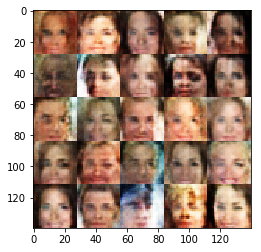

Epoch 4/10... Discriminator Loss: 1.4528... Generator Loss: 0.6474
Epoch 4/10... Discriminator Loss: 1.4213... Generator Loss: 0.6746
Epoch 4/10... Discriminator Loss: 1.4200... Generator Loss: 0.6701
Epoch 4/10... Discriminator Loss: 1.4433... Generator Loss: 0.6982
Epoch 4/10... Discriminator Loss: 1.4021... Generator Loss: 0.6850
Epoch 4/10... Discriminator Loss: 1.4203... Generator Loss: 0.7230
Epoch 4/10... Discriminator Loss: 1.4250... Generator Loss: 0.6908
Epoch 4/10... Discriminator Loss: 1.3844... Generator Loss: 0.7148
Epoch 4/10... Discriminator Loss: 1.4184... Generator Loss: 0.7195
Epoch 4/10... Discriminator Loss: 1.3960... Generator Loss: 0.6660


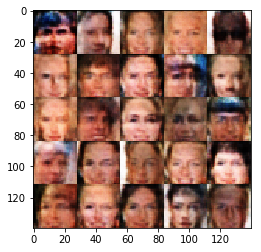

Epoch 4/10... Discriminator Loss: 1.4012... Generator Loss: 0.6973
Epoch 4/10... Discriminator Loss: 1.4246... Generator Loss: 0.6964
Epoch 4/10... Discriminator Loss: 1.3991... Generator Loss: 0.6926
Epoch 4/10... Discriminator Loss: 1.3963... Generator Loss: 0.6951
Epoch 4/10... Discriminator Loss: 1.4033... Generator Loss: 0.6813
Epoch 4/10... Discriminator Loss: 1.4091... Generator Loss: 0.6929
Epoch 4/10... Discriminator Loss: 1.3995... Generator Loss: 0.6725
Epoch 4/10... Discriminator Loss: 1.4193... Generator Loss: 0.6852
Epoch 4/10... Discriminator Loss: 1.3837... Generator Loss: 0.6991
Epoch 4/10... Discriminator Loss: 1.3685... Generator Loss: 0.7253


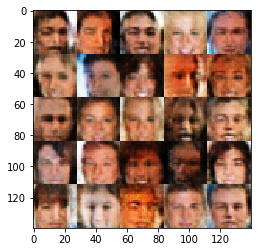

Epoch 4/10... Discriminator Loss: 1.3959... Generator Loss: 0.6892
Epoch 4/10... Discriminator Loss: 1.3824... Generator Loss: 0.6969
Epoch 4/10... Discriminator Loss: 1.3869... Generator Loss: 0.6988
Epoch 4/10... Discriminator Loss: 1.3816... Generator Loss: 0.6567
Epoch 4/10... Discriminator Loss: 1.4261... Generator Loss: 0.6654
Epoch 4/10... Discriminator Loss: 1.4049... Generator Loss: 0.6621
Epoch 4/10... Discriminator Loss: 1.4460... Generator Loss: 0.6997
Epoch 4/10... Discriminator Loss: 1.4235... Generator Loss: 0.6643
Epoch 4/10... Discriminator Loss: 1.3761... Generator Loss: 0.6826
Epoch 4/10... Discriminator Loss: 1.4188... Generator Loss: 0.6761


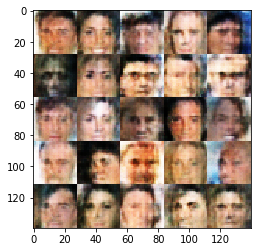

Epoch 4/10... Discriminator Loss: 1.4222... Generator Loss: 0.6591
Epoch 4/10... Discriminator Loss: 1.3861... Generator Loss: 0.6762
Epoch 4/10... Discriminator Loss: 1.3913... Generator Loss: 0.6813
Epoch 4/10... Discriminator Loss: 1.4063... Generator Loss: 0.7012
Epoch 4/10... Discriminator Loss: 1.4097... Generator Loss: 0.6722
Epoch 4/10... Discriminator Loss: 1.3935... Generator Loss: 0.6885
Epoch 4/10... Discriminator Loss: 1.4113... Generator Loss: 0.7064
Epoch 4/10... Discriminator Loss: 1.4230... Generator Loss: 0.6761
Epoch 4/10... Discriminator Loss: 1.4114... Generator Loss: 0.6758
Epoch 4/10... Discriminator Loss: 1.4082... Generator Loss: 0.6754


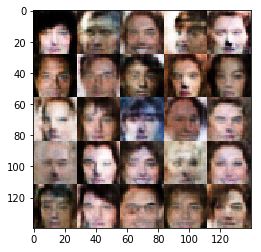

Epoch 4/10... Discriminator Loss: 1.4144... Generator Loss: 0.6810
Epoch 4/10... Discriminator Loss: 1.4086... Generator Loss: 0.6938
Epoch 4/10... Discriminator Loss: 1.4213... Generator Loss: 0.6563
Epoch 4/10... Discriminator Loss: 1.3984... Generator Loss: 0.6949
Epoch 4/10... Discriminator Loss: 1.3813... Generator Loss: 0.6771
Epoch 4/10... Discriminator Loss: 1.3901... Generator Loss: 0.7008
Epoch 4/10... Discriminator Loss: 1.3924... Generator Loss: 0.7105
Epoch 4/10... Discriminator Loss: 1.4275... Generator Loss: 0.6607
Epoch 4/10... Discriminator Loss: 1.4136... Generator Loss: 0.6799
Epoch 4/10... Discriminator Loss: 1.4168... Generator Loss: 0.6920


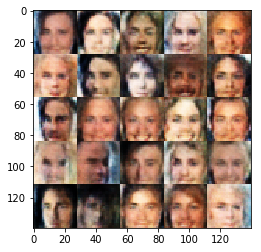

Epoch 4/10... Discriminator Loss: 1.3794... Generator Loss: 0.7162
Epoch 4/10... Discriminator Loss: 1.3957... Generator Loss: 0.6942
Epoch 4/10... Discriminator Loss: 1.3878... Generator Loss: 0.6681
Epoch 4/10... Discriminator Loss: 1.4160... Generator Loss: 0.6620
Epoch 4/10... Discriminator Loss: 1.3862... Generator Loss: 0.7018
Epoch 4/10... Discriminator Loss: 1.3777... Generator Loss: 0.6740
Epoch 4/10... Discriminator Loss: 1.3929... Generator Loss: 0.7038
Epoch 4/10... Discriminator Loss: 1.4138... Generator Loss: 0.6910
Epoch 4/10... Discriminator Loss: 1.4187... Generator Loss: 0.6699
Epoch 4/10... Discriminator Loss: 1.4352... Generator Loss: 0.6544


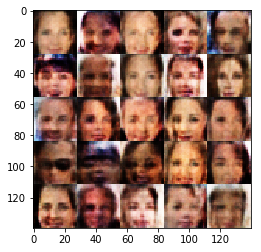

Epoch 4/10... Discriminator Loss: 1.3954... Generator Loss: 0.6600
Epoch 4/10... Discriminator Loss: 1.3980... Generator Loss: 0.6777
Epoch 4/10... Discriminator Loss: 1.3912... Generator Loss: 0.6697
Epoch 4/10... Discriminator Loss: 1.4030... Generator Loss: 0.6589
Epoch 4/10... Discriminator Loss: 1.4007... Generator Loss: 0.6974
Epoch 4/10... Discriminator Loss: 1.3959... Generator Loss: 0.6664
Epoch 4/10... Discriminator Loss: 1.4023... Generator Loss: 0.6500
Epoch 4/10... Discriminator Loss: 1.3956... Generator Loss: 0.6807
Epoch 4/10... Discriminator Loss: 1.4147... Generator Loss: 0.6811
Epoch 4/10... Discriminator Loss: 1.3959... Generator Loss: 0.6729


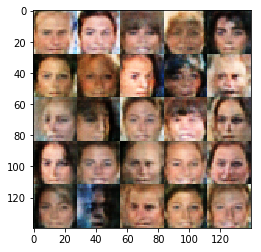

Epoch 4/10... Discriminator Loss: 1.4075... Generator Loss: 0.6855
Epoch 4/10... Discriminator Loss: 1.3868... Generator Loss: 0.6995
Epoch 4/10... Discriminator Loss: 1.4046... Generator Loss: 0.7033
Epoch 4/10... Discriminator Loss: 1.3884... Generator Loss: 0.6777
Epoch 4/10... Discriminator Loss: 1.4037... Generator Loss: 0.7127
Epoch 4/10... Discriminator Loss: 1.4086... Generator Loss: 0.6870
Epoch 4/10... Discriminator Loss: 1.4033... Generator Loss: 0.6726
Epoch 4/10... Discriminator Loss: 1.3897... Generator Loss: 0.6637
Epoch 4/10... Discriminator Loss: 1.4100... Generator Loss: 0.6642
Epoch 4/10... Discriminator Loss: 1.4107... Generator Loss: 0.6864


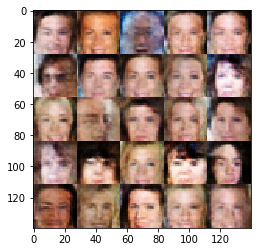

Epoch 4/10... Discriminator Loss: 1.4297... Generator Loss: 0.6412
Epoch 4/10... Discriminator Loss: 1.4023... Generator Loss: 0.7013
Epoch 4/10... Discriminator Loss: 1.3873... Generator Loss: 0.6768
Epoch 4/10... Discriminator Loss: 1.3964... Generator Loss: 0.7013
Epoch 4/10... Discriminator Loss: 1.3971... Generator Loss: 0.6954
Epoch 4/10... Discriminator Loss: 1.3977... Generator Loss: 0.6918
Epoch 4/10... Discriminator Loss: 1.3858... Generator Loss: 0.6962
Epoch 4/10... Discriminator Loss: 1.4348... Generator Loss: 0.6623
Epoch 4/10... Discriminator Loss: 1.4211... Generator Loss: 0.6742
Epoch 4/10... Discriminator Loss: 1.4060... Generator Loss: 0.6986


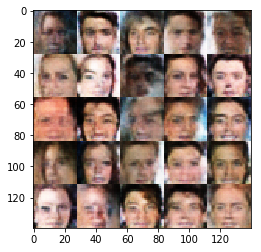

Epoch 4/10... Discriminator Loss: 1.3798... Generator Loss: 0.6785
Epoch 4/10... Discriminator Loss: 1.4247... Generator Loss: 0.6468
Epoch 4/10... Discriminator Loss: 1.4512... Generator Loss: 0.6855
Epoch 4/10... Discriminator Loss: 1.4175... Generator Loss: 0.6912
Epoch 4/10... Discriminator Loss: 1.3873... Generator Loss: 0.6637
Epoch 4/10... Discriminator Loss: 1.4011... Generator Loss: 0.6801
Epoch 4/10... Discriminator Loss: 1.3862... Generator Loss: 0.7008
Epoch 4/10... Discriminator Loss: 1.3768... Generator Loss: 0.6962
Epoch 4/10... Discriminator Loss: 1.4165... Generator Loss: 0.6792
Epoch 4/10... Discriminator Loss: 1.4004... Generator Loss: 0.6986


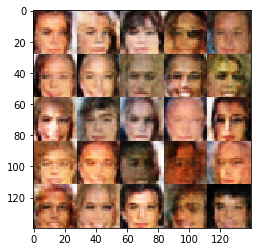

Epoch 4/10... Discriminator Loss: 1.3994... Generator Loss: 0.6612
Epoch 4/10... Discriminator Loss: 1.3911... Generator Loss: 0.6901
Epoch 4/10... Discriminator Loss: 1.3949... Generator Loss: 0.7058
Epoch 4/10... Discriminator Loss: 1.3930... Generator Loss: 0.6795
Epoch 4/10... Discriminator Loss: 1.4140... Generator Loss: 0.6458
Epoch 4/10... Discriminator Loss: 1.4066... Generator Loss: 0.6714
Epoch 4/10... Discriminator Loss: 1.4055... Generator Loss: 0.6502
Epoch 4/10... Discriminator Loss: 1.3881... Generator Loss: 0.6874
Epoch 4/10... Discriminator Loss: 1.3986... Generator Loss: 0.6769
Epoch 4/10... Discriminator Loss: 1.4080... Generator Loss: 0.7043


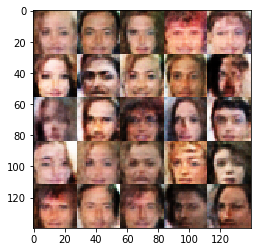

Epoch 4/10... Discriminator Loss: 1.3968... Generator Loss: 0.6607
Epoch 4/10... Discriminator Loss: 1.4019... Generator Loss: 0.6871
Epoch 5/10... Discriminator Loss: 1.3808... Generator Loss: 0.6666
Epoch 5/10... Discriminator Loss: 1.3923... Generator Loss: 0.6989
Epoch 5/10... Discriminator Loss: 1.3983... Generator Loss: 0.6914
Epoch 5/10... Discriminator Loss: 1.4019... Generator Loss: 0.7024
Epoch 5/10... Discriminator Loss: 1.4147... Generator Loss: 0.6897
Epoch 5/10... Discriminator Loss: 1.4188... Generator Loss: 0.6835
Epoch 5/10... Discriminator Loss: 1.4176... Generator Loss: 0.6612
Epoch 5/10... Discriminator Loss: 1.3882... Generator Loss: 0.6825


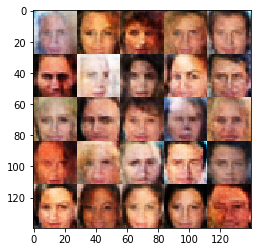

Epoch 5/10... Discriminator Loss: 1.3937... Generator Loss: 0.6619
Epoch 5/10... Discriminator Loss: 1.4306... Generator Loss: 0.6765
Epoch 5/10... Discriminator Loss: 1.4273... Generator Loss: 0.6627
Epoch 5/10... Discriminator Loss: 1.3886... Generator Loss: 0.7013
Epoch 5/10... Discriminator Loss: 1.3934... Generator Loss: 0.7370
Epoch 5/10... Discriminator Loss: 1.4194... Generator Loss: 0.6350
Epoch 5/10... Discriminator Loss: 1.4009... Generator Loss: 0.6690
Epoch 5/10... Discriminator Loss: 1.3965... Generator Loss: 0.7056
Epoch 5/10... Discriminator Loss: 1.4152... Generator Loss: 0.6740
Epoch 5/10... Discriminator Loss: 1.4180... Generator Loss: 0.6763


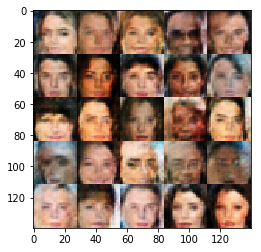

Epoch 5/10... Discriminator Loss: 1.3950... Generator Loss: 0.6855
Epoch 5/10... Discriminator Loss: 1.3750... Generator Loss: 0.7152
Epoch 5/10... Discriminator Loss: 1.3876... Generator Loss: 0.7159
Epoch 5/10... Discriminator Loss: 1.4239... Generator Loss: 0.6630
Epoch 5/10... Discriminator Loss: 1.4123... Generator Loss: 0.6710
Epoch 5/10... Discriminator Loss: 1.4205... Generator Loss: 0.6412
Epoch 5/10... Discriminator Loss: 1.3827... Generator Loss: 0.6914
Epoch 5/10... Discriminator Loss: 1.3968... Generator Loss: 0.6690
Epoch 5/10... Discriminator Loss: 1.3783... Generator Loss: 0.6737
Epoch 5/10... Discriminator Loss: 1.3990... Generator Loss: 0.6931


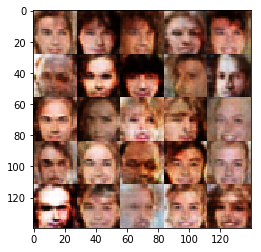

Epoch 5/10... Discriminator Loss: 1.3923... Generator Loss: 0.7153
Epoch 5/10... Discriminator Loss: 1.3982... Generator Loss: 0.6866
Epoch 5/10... Discriminator Loss: 1.4201... Generator Loss: 0.6991
Epoch 5/10... Discriminator Loss: 1.3742... Generator Loss: 0.7161
Epoch 5/10... Discriminator Loss: 1.4087... Generator Loss: 0.7207
Epoch 5/10... Discriminator Loss: 1.3910... Generator Loss: 0.6820
Epoch 5/10... Discriminator Loss: 1.4122... Generator Loss: 0.6635
Epoch 5/10... Discriminator Loss: 1.4188... Generator Loss: 0.6586
Epoch 5/10... Discriminator Loss: 1.4094... Generator Loss: 0.6800
Epoch 5/10... Discriminator Loss: 1.4185... Generator Loss: 0.6471


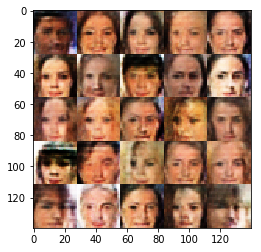

Epoch 5/10... Discriminator Loss: 1.4149... Generator Loss: 0.6641
Epoch 5/10... Discriminator Loss: 1.3954... Generator Loss: 0.6653
Epoch 5/10... Discriminator Loss: 1.3942... Generator Loss: 0.6684
Epoch 5/10... Discriminator Loss: 1.3855... Generator Loss: 0.6849
Epoch 5/10... Discriminator Loss: 1.4014... Generator Loss: 0.6845
Epoch 5/10... Discriminator Loss: 1.4233... Generator Loss: 0.6285
Epoch 5/10... Discriminator Loss: 1.3863... Generator Loss: 0.6743
Epoch 5/10... Discriminator Loss: 1.3965... Generator Loss: 0.7098
Epoch 5/10... Discriminator Loss: 1.3901... Generator Loss: 0.6624
Epoch 5/10... Discriminator Loss: 1.3916... Generator Loss: 0.7054


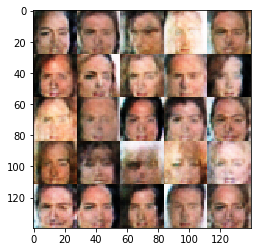

Epoch 5/10... Discriminator Loss: 1.4206... Generator Loss: 0.6590
Epoch 5/10... Discriminator Loss: 1.3958... Generator Loss: 0.6802
Epoch 5/10... Discriminator Loss: 1.3829... Generator Loss: 0.6804
Epoch 5/10... Discriminator Loss: 1.4041... Generator Loss: 0.6890
Epoch 5/10... Discriminator Loss: 1.4003... Generator Loss: 0.6850
Epoch 5/10... Discriminator Loss: 1.4093... Generator Loss: 0.7022
Epoch 5/10... Discriminator Loss: 1.3827... Generator Loss: 0.6821
Epoch 5/10... Discriminator Loss: 1.3888... Generator Loss: 0.6974
Epoch 5/10... Discriminator Loss: 1.4362... Generator Loss: 0.6555
Epoch 5/10... Discriminator Loss: 1.3961... Generator Loss: 0.7222


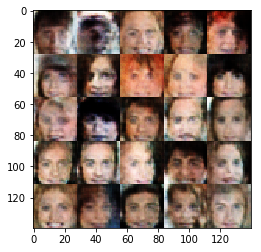

Epoch 5/10... Discriminator Loss: 1.4184... Generator Loss: 0.6276
Epoch 5/10... Discriminator Loss: 1.3913... Generator Loss: 0.6815
Epoch 5/10... Discriminator Loss: 1.3994... Generator Loss: 0.6799
Epoch 5/10... Discriminator Loss: 1.3992... Generator Loss: 0.6397
Epoch 5/10... Discriminator Loss: 1.4246... Generator Loss: 0.6737
Epoch 5/10... Discriminator Loss: 1.4281... Generator Loss: 0.6656
Epoch 5/10... Discriminator Loss: 1.4081... Generator Loss: 0.7009
Epoch 5/10... Discriminator Loss: 1.4017... Generator Loss: 0.6726
Epoch 5/10... Discriminator Loss: 1.4091... Generator Loss: 0.6655
Epoch 5/10... Discriminator Loss: 1.4045... Generator Loss: 0.6739


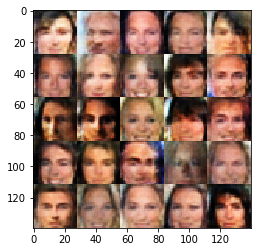

Epoch 5/10... Discriminator Loss: 1.3870... Generator Loss: 0.7185
Epoch 5/10... Discriminator Loss: 1.3885... Generator Loss: 0.6953
Epoch 5/10... Discriminator Loss: 1.4090... Generator Loss: 0.6720
Epoch 5/10... Discriminator Loss: 1.4165... Generator Loss: 0.6780
Epoch 5/10... Discriminator Loss: 1.3901... Generator Loss: 0.7136
Epoch 5/10... Discriminator Loss: 1.3896... Generator Loss: 0.6981
Epoch 5/10... Discriminator Loss: 1.3981... Generator Loss: 0.7160
Epoch 5/10... Discriminator Loss: 1.3949... Generator Loss: 0.7162
Epoch 5/10... Discriminator Loss: 1.4165... Generator Loss: 0.6802
Epoch 5/10... Discriminator Loss: 1.3860... Generator Loss: 0.6898


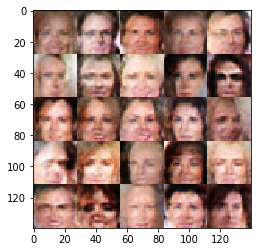

Epoch 5/10... Discriminator Loss: 1.3743... Generator Loss: 0.7170
Epoch 5/10... Discriminator Loss: 1.4098... Generator Loss: 0.6692
Epoch 5/10... Discriminator Loss: 1.4096... Generator Loss: 0.6970
Epoch 5/10... Discriminator Loss: 1.4105... Generator Loss: 0.6536
Epoch 5/10... Discriminator Loss: 1.4086... Generator Loss: 0.6675
Epoch 5/10... Discriminator Loss: 1.3812... Generator Loss: 0.6931
Epoch 5/10... Discriminator Loss: 1.4160... Generator Loss: 0.6661
Epoch 5/10... Discriminator Loss: 1.3976... Generator Loss: 0.7315
Epoch 5/10... Discriminator Loss: 1.3991... Generator Loss: 0.7042
Epoch 5/10... Discriminator Loss: 1.4066... Generator Loss: 0.6542


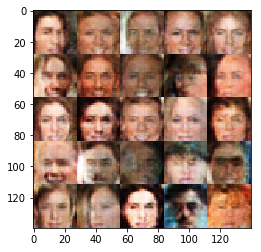

Epoch 5/10... Discriminator Loss: 1.4011... Generator Loss: 0.7162
Epoch 5/10... Discriminator Loss: 1.3848... Generator Loss: 0.6989
Epoch 5/10... Discriminator Loss: 1.3958... Generator Loss: 0.6864
Epoch 5/10... Discriminator Loss: 1.4094... Generator Loss: 0.6847
Epoch 5/10... Discriminator Loss: 1.3759... Generator Loss: 0.6989
Epoch 5/10... Discriminator Loss: 1.4025... Generator Loss: 0.6918
Epoch 5/10... Discriminator Loss: 1.4018... Generator Loss: 0.6828
Epoch 5/10... Discriminator Loss: 1.3904... Generator Loss: 0.7204
Epoch 5/10... Discriminator Loss: 1.4136... Generator Loss: 0.6695
Epoch 5/10... Discriminator Loss: 1.3777... Generator Loss: 0.6825


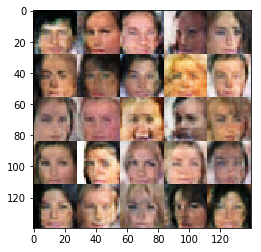

Epoch 5/10... Discriminator Loss: 1.3951... Generator Loss: 0.6810
Epoch 5/10... Discriminator Loss: 1.4320... Generator Loss: 0.6855
Epoch 5/10... Discriminator Loss: 1.3789... Generator Loss: 0.6901
Epoch 5/10... Discriminator Loss: 1.3870... Generator Loss: 0.6667
Epoch 5/10... Discriminator Loss: 1.3936... Generator Loss: 0.7053
Epoch 5/10... Discriminator Loss: 1.3980... Generator Loss: 0.6626
Epoch 5/10... Discriminator Loss: 1.3981... Generator Loss: 0.7023
Epoch 5/10... Discriminator Loss: 1.4040... Generator Loss: 0.7045
Epoch 5/10... Discriminator Loss: 1.4198... Generator Loss: 0.6923
Epoch 5/10... Discriminator Loss: 1.4187... Generator Loss: 0.6501


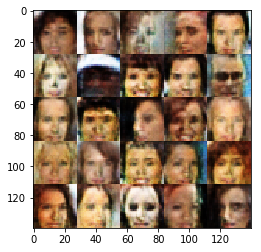

Epoch 5/10... Discriminator Loss: 1.4176... Generator Loss: 0.6755
Epoch 5/10... Discriminator Loss: 1.4003... Generator Loss: 0.7017
Epoch 5/10... Discriminator Loss: 1.4033... Generator Loss: 0.6794
Epoch 5/10... Discriminator Loss: 1.4036... Generator Loss: 0.7085
Epoch 5/10... Discriminator Loss: 1.4185... Generator Loss: 0.6674
Epoch 5/10... Discriminator Loss: 1.3989... Generator Loss: 0.6723
Epoch 5/10... Discriminator Loss: 1.4152... Generator Loss: 0.6688
Epoch 5/10... Discriminator Loss: 1.4112... Generator Loss: 0.6754
Epoch 5/10... Discriminator Loss: 1.3833... Generator Loss: 0.6856
Epoch 5/10... Discriminator Loss: 1.3836... Generator Loss: 0.6766


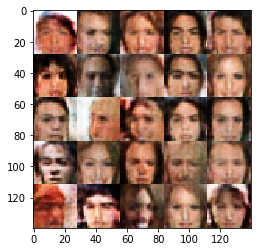

Epoch 5/10... Discriminator Loss: 1.3905... Generator Loss: 0.6859
Epoch 5/10... Discriminator Loss: 1.4047... Generator Loss: 0.6510
Epoch 5/10... Discriminator Loss: 1.3926... Generator Loss: 0.6617
Epoch 5/10... Discriminator Loss: 1.4049... Generator Loss: 0.6482
Epoch 5/10... Discriminator Loss: 1.3919... Generator Loss: 0.7069
Epoch 5/10... Discriminator Loss: 1.3896... Generator Loss: 0.7021
Epoch 5/10... Discriminator Loss: 1.3899... Generator Loss: 0.7060
Epoch 5/10... Discriminator Loss: 1.4068... Generator Loss: 0.6874
Epoch 5/10... Discriminator Loss: 1.3818... Generator Loss: 0.6970
Epoch 5/10... Discriminator Loss: 1.3924... Generator Loss: 0.6713


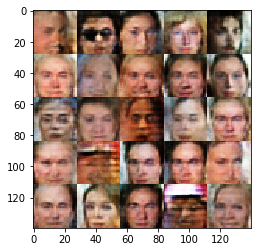

Epoch 5/10... Discriminator Loss: 1.3908... Generator Loss: 0.6706
Epoch 5/10... Discriminator Loss: 1.4024... Generator Loss: 0.6601
Epoch 5/10... Discriminator Loss: 1.4004... Generator Loss: 0.6868
Epoch 5/10... Discriminator Loss: 1.4037... Generator Loss: 0.7112
Epoch 5/10... Discriminator Loss: 1.3991... Generator Loss: 0.6819
Epoch 5/10... Discriminator Loss: 1.3959... Generator Loss: 0.7069
Epoch 5/10... Discriminator Loss: 1.3863... Generator Loss: 0.6979
Epoch 5/10... Discriminator Loss: 1.3937... Generator Loss: 0.6393
Epoch 5/10... Discriminator Loss: 1.3987... Generator Loss: 0.7201
Epoch 5/10... Discriminator Loss: 1.3896... Generator Loss: 0.6900


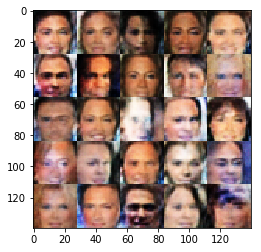

Epoch 5/10... Discriminator Loss: 1.4010... Generator Loss: 0.6820
Epoch 5/10... Discriminator Loss: 1.3923... Generator Loss: 0.6674
Epoch 5/10... Discriminator Loss: 1.4028... Generator Loss: 0.6823
Epoch 5/10... Discriminator Loss: 1.4202... Generator Loss: 0.7064
Epoch 5/10... Discriminator Loss: 1.3905... Generator Loss: 0.6763
Epoch 5/10... Discriminator Loss: 1.4236... Generator Loss: 0.6865
Epoch 5/10... Discriminator Loss: 1.4132... Generator Loss: 0.6689
Epoch 5/10... Discriminator Loss: 1.3942... Generator Loss: 0.6754
Epoch 5/10... Discriminator Loss: 1.3991... Generator Loss: 0.6844
Epoch 5/10... Discriminator Loss: 1.3956... Generator Loss: 0.7190


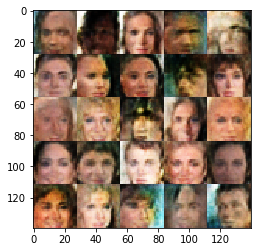

Epoch 5/10... Discriminator Loss: 1.3963... Generator Loss: 0.6636
Epoch 5/10... Discriminator Loss: 1.3801... Generator Loss: 0.6916
Epoch 5/10... Discriminator Loss: 1.3981... Generator Loss: 0.6713
Epoch 5/10... Discriminator Loss: 1.4088... Generator Loss: 0.6737
Epoch 5/10... Discriminator Loss: 1.3883... Generator Loss: 0.7099
Epoch 5/10... Discriminator Loss: 1.4068... Generator Loss: 0.6785
Epoch 5/10... Discriminator Loss: 1.3999... Generator Loss: 0.6960
Epoch 5/10... Discriminator Loss: 1.3890... Generator Loss: 0.7040
Epoch 5/10... Discriminator Loss: 1.3826... Generator Loss: 0.6873
Epoch 5/10... Discriminator Loss: 1.3778... Generator Loss: 0.6809


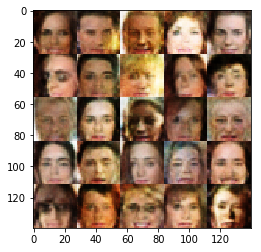

Epoch 5/10... Discriminator Loss: 1.3913... Generator Loss: 0.6748
Epoch 6/10... Discriminator Loss: 1.3905... Generator Loss: 0.6766
Epoch 6/10... Discriminator Loss: 1.3949... Generator Loss: 0.7319
Epoch 6/10... Discriminator Loss: 1.3969... Generator Loss: 0.6618
Epoch 6/10... Discriminator Loss: 1.3962... Generator Loss: 0.6803
Epoch 6/10... Discriminator Loss: 1.3726... Generator Loss: 0.7255
Epoch 6/10... Discriminator Loss: 1.4116... Generator Loss: 0.6519
Epoch 6/10... Discriminator Loss: 1.4028... Generator Loss: 0.6790
Epoch 6/10... Discriminator Loss: 1.3954... Generator Loss: 0.7151
Epoch 6/10... Discriminator Loss: 1.3921... Generator Loss: 0.6831


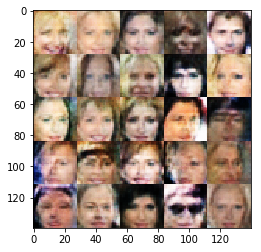

Epoch 6/10... Discriminator Loss: 1.3893... Generator Loss: 0.7045
Epoch 6/10... Discriminator Loss: 1.3845... Generator Loss: 0.7119
Epoch 6/10... Discriminator Loss: 1.3992... Generator Loss: 0.6963
Epoch 6/10... Discriminator Loss: 1.4361... Generator Loss: 0.6647
Epoch 6/10... Discriminator Loss: 1.3970... Generator Loss: 0.6767
Epoch 6/10... Discriminator Loss: 1.4262... Generator Loss: 0.6529
Epoch 6/10... Discriminator Loss: 1.3860... Generator Loss: 0.7293
Epoch 6/10... Discriminator Loss: 1.3805... Generator Loss: 0.7061
Epoch 6/10... Discriminator Loss: 1.3887... Generator Loss: 0.6853
Epoch 6/10... Discriminator Loss: 1.3903... Generator Loss: 0.6843


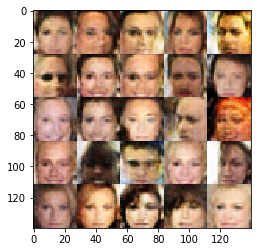

Epoch 6/10... Discriminator Loss: 1.3933... Generator Loss: 0.6627
Epoch 6/10... Discriminator Loss: 1.3971... Generator Loss: 0.6744
Epoch 6/10... Discriminator Loss: 1.4009... Generator Loss: 0.6556
Epoch 6/10... Discriminator Loss: 1.3981... Generator Loss: 0.6814
Epoch 6/10... Discriminator Loss: 1.4076... Generator Loss: 0.6791
Epoch 6/10... Discriminator Loss: 1.3922... Generator Loss: 0.6917
Epoch 6/10... Discriminator Loss: 1.3978... Generator Loss: 0.7017
Epoch 6/10... Discriminator Loss: 1.3753... Generator Loss: 0.7252
Epoch 6/10... Discriminator Loss: 1.3776... Generator Loss: 0.6929
Epoch 6/10... Discriminator Loss: 1.3991... Generator Loss: 0.7003


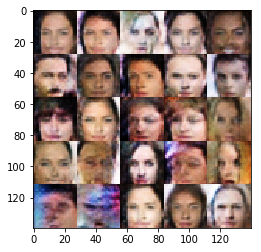

Epoch 6/10... Discriminator Loss: 1.4057... Generator Loss: 0.6647
Epoch 6/10... Discriminator Loss: 1.4049... Generator Loss: 0.6690
Epoch 6/10... Discriminator Loss: 1.4198... Generator Loss: 0.6811
Epoch 6/10... Discriminator Loss: 1.4001... Generator Loss: 0.6592
Epoch 6/10... Discriminator Loss: 1.3954... Generator Loss: 0.6774
Epoch 6/10... Discriminator Loss: 1.3760... Generator Loss: 0.6639
Epoch 6/10... Discriminator Loss: 1.3922... Generator Loss: 0.6626
Epoch 6/10... Discriminator Loss: 1.4070... Generator Loss: 0.6633
Epoch 6/10... Discriminator Loss: 1.3951... Generator Loss: 0.7109
Epoch 6/10... Discriminator Loss: 1.3879... Generator Loss: 0.6867


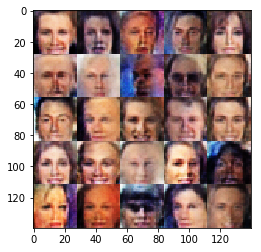

Epoch 6/10... Discriminator Loss: 1.3801... Generator Loss: 0.7151
Epoch 6/10... Discriminator Loss: 1.3979... Generator Loss: 0.6626
Epoch 6/10... Discriminator Loss: 1.4065... Generator Loss: 0.6585
Epoch 6/10... Discriminator Loss: 1.4139... Generator Loss: 0.6964
Epoch 6/10... Discriminator Loss: 1.3741... Generator Loss: 0.7158
Epoch 6/10... Discriminator Loss: 1.4004... Generator Loss: 0.6825
Epoch 6/10... Discriminator Loss: 1.4046... Generator Loss: 0.6924
Epoch 6/10... Discriminator Loss: 1.4052... Generator Loss: 0.6909
Epoch 6/10... Discriminator Loss: 1.3861... Generator Loss: 0.6690
Epoch 6/10... Discriminator Loss: 1.3890... Generator Loss: 0.6891


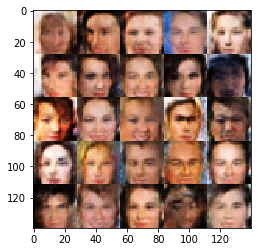

Epoch 6/10... Discriminator Loss: 1.4084... Generator Loss: 0.6918
Epoch 6/10... Discriminator Loss: 1.3971... Generator Loss: 0.6941
Epoch 6/10... Discriminator Loss: 1.4184... Generator Loss: 0.6384
Epoch 6/10... Discriminator Loss: 1.3766... Generator Loss: 0.6944
Epoch 6/10... Discriminator Loss: 1.4221... Generator Loss: 0.6603
Epoch 6/10... Discriminator Loss: 1.4095... Generator Loss: 0.6659
Epoch 6/10... Discriminator Loss: 1.3873... Generator Loss: 0.6753
Epoch 6/10... Discriminator Loss: 1.3933... Generator Loss: 0.6787
Epoch 6/10... Discriminator Loss: 1.3984... Generator Loss: 0.6779
Epoch 6/10... Discriminator Loss: 1.3929... Generator Loss: 0.7409


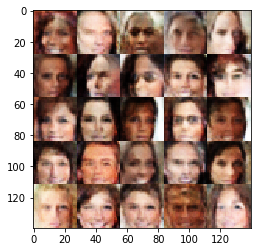

Epoch 6/10... Discriminator Loss: 1.4147... Generator Loss: 0.6805
Epoch 6/10... Discriminator Loss: 1.3929... Generator Loss: 0.7130
Epoch 6/10... Discriminator Loss: 1.3825... Generator Loss: 0.6817
Epoch 6/10... Discriminator Loss: 1.3987... Generator Loss: 0.6933
Epoch 6/10... Discriminator Loss: 1.3956... Generator Loss: 0.7004
Epoch 6/10... Discriminator Loss: 1.3716... Generator Loss: 0.7309
Epoch 6/10... Discriminator Loss: 1.3871... Generator Loss: 0.6823
Epoch 6/10... Discriminator Loss: 1.3946... Generator Loss: 0.6928
Epoch 6/10... Discriminator Loss: 1.3954... Generator Loss: 0.6790
Epoch 6/10... Discriminator Loss: 1.3873... Generator Loss: 0.7052


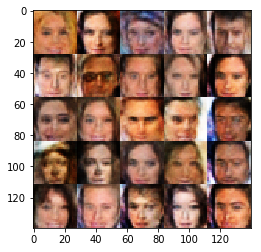

Epoch 6/10... Discriminator Loss: 1.4016... Generator Loss: 0.7031
Epoch 6/10... Discriminator Loss: 1.4051... Generator Loss: 0.6952
Epoch 6/10... Discriminator Loss: 1.4001... Generator Loss: 0.6722
Epoch 6/10... Discriminator Loss: 1.4001... Generator Loss: 0.6686
Epoch 6/10... Discriminator Loss: 1.3933... Generator Loss: 0.6431
Epoch 6/10... Discriminator Loss: 1.3979... Generator Loss: 0.6595
Epoch 6/10... Discriminator Loss: 1.4072... Generator Loss: 0.6739
Epoch 6/10... Discriminator Loss: 1.4089... Generator Loss: 0.7039
Epoch 6/10... Discriminator Loss: 1.3807... Generator Loss: 0.7122
Epoch 6/10... Discriminator Loss: 1.4051... Generator Loss: 0.6797


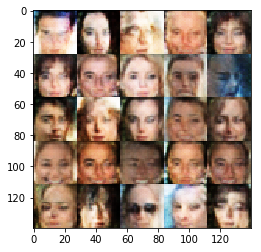

Epoch 6/10... Discriminator Loss: 1.3811... Generator Loss: 0.7083
Epoch 6/10... Discriminator Loss: 1.3904... Generator Loss: 0.7094
Epoch 6/10... Discriminator Loss: 1.3863... Generator Loss: 0.6946
Epoch 6/10... Discriminator Loss: 1.3957... Generator Loss: 0.7049
Epoch 6/10... Discriminator Loss: 1.3866... Generator Loss: 0.7040
Epoch 6/10... Discriminator Loss: 1.3832... Generator Loss: 0.6799
Epoch 6/10... Discriminator Loss: 1.3860... Generator Loss: 0.6954
Epoch 6/10... Discriminator Loss: 1.3908... Generator Loss: 0.6987
Epoch 6/10... Discriminator Loss: 1.3917... Generator Loss: 0.6898
Epoch 6/10... Discriminator Loss: 1.3936... Generator Loss: 0.6770


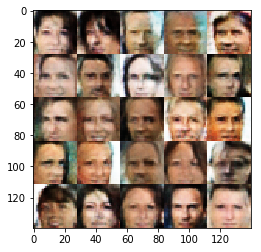

Epoch 6/10... Discriminator Loss: 1.3811... Generator Loss: 0.6758
Epoch 6/10... Discriminator Loss: 1.4046... Generator Loss: 0.7015
Epoch 6/10... Discriminator Loss: 1.3749... Generator Loss: 0.7102
Epoch 6/10... Discriminator Loss: 1.3721... Generator Loss: 0.7067
Epoch 6/10... Discriminator Loss: 1.3920... Generator Loss: 0.7099
Epoch 6/10... Discriminator Loss: 1.3973... Generator Loss: 0.6937
Epoch 6/10... Discriminator Loss: 1.3901... Generator Loss: 0.6810
Epoch 6/10... Discriminator Loss: 1.4030... Generator Loss: 0.6601
Epoch 6/10... Discriminator Loss: 1.3829... Generator Loss: 0.6723
Epoch 6/10... Discriminator Loss: 1.4052... Generator Loss: 0.6593


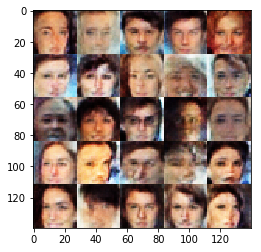

Epoch 6/10... Discriminator Loss: 1.3989... Generator Loss: 0.6841
Epoch 6/10... Discriminator Loss: 1.4084... Generator Loss: 0.6612
Epoch 6/10... Discriminator Loss: 1.3880... Generator Loss: 0.6895
Epoch 6/10... Discriminator Loss: 1.3962... Generator Loss: 0.6699
Epoch 6/10... Discriminator Loss: 1.3785... Generator Loss: 0.6926
Epoch 6/10... Discriminator Loss: 1.3818... Generator Loss: 0.6967
Epoch 6/10... Discriminator Loss: 1.4025... Generator Loss: 0.6809
Epoch 6/10... Discriminator Loss: 1.4113... Generator Loss: 0.6685
Epoch 6/10... Discriminator Loss: 1.3835... Generator Loss: 0.6935
Epoch 6/10... Discriminator Loss: 1.3701... Generator Loss: 0.7123


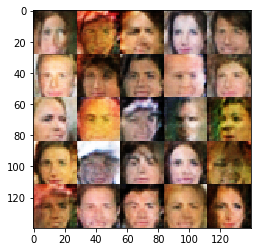

Epoch 6/10... Discriminator Loss: 1.4234... Generator Loss: 0.6240
Epoch 6/10... Discriminator Loss: 1.4024... Generator Loss: 0.6651
Epoch 6/10... Discriminator Loss: 1.3819... Generator Loss: 0.6762
Epoch 6/10... Discriminator Loss: 1.3895... Generator Loss: 0.7287
Epoch 6/10... Discriminator Loss: 1.3869... Generator Loss: 0.6883
Epoch 6/10... Discriminator Loss: 1.3913... Generator Loss: 0.7118
Epoch 6/10... Discriminator Loss: 1.3864... Generator Loss: 0.6624
Epoch 6/10... Discriminator Loss: 1.3823... Generator Loss: 0.7016
Epoch 6/10... Discriminator Loss: 1.4049... Generator Loss: 0.6593
Epoch 6/10... Discriminator Loss: 1.3958... Generator Loss: 0.6601


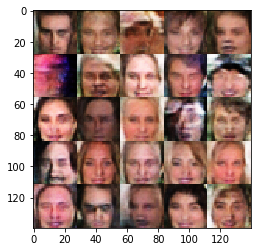

Epoch 6/10... Discriminator Loss: 1.3920... Generator Loss: 0.6796
Epoch 6/10... Discriminator Loss: 1.3946... Generator Loss: 0.6851
Epoch 6/10... Discriminator Loss: 1.3848... Generator Loss: 0.6761
Epoch 6/10... Discriminator Loss: 1.4023... Generator Loss: 0.6834
Epoch 6/10... Discriminator Loss: 1.3966... Generator Loss: 0.6687
Epoch 6/10... Discriminator Loss: 1.3981... Generator Loss: 0.6821
Epoch 6/10... Discriminator Loss: 1.3955... Generator Loss: 0.6704
Epoch 6/10... Discriminator Loss: 1.3952... Generator Loss: 0.7164
Epoch 6/10... Discriminator Loss: 1.3884... Generator Loss: 0.6674
Epoch 6/10... Discriminator Loss: 1.3980... Generator Loss: 0.6953


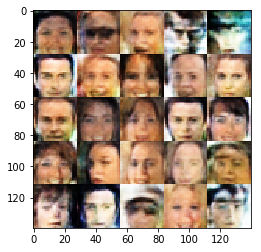

Epoch 6/10... Discriminator Loss: 1.3790... Generator Loss: 0.7047
Epoch 6/10... Discriminator Loss: 1.4135... Generator Loss: 0.6728
Epoch 6/10... Discriminator Loss: 1.3775... Generator Loss: 0.7311
Epoch 6/10... Discriminator Loss: 1.4067... Generator Loss: 0.6860
Epoch 6/10... Discriminator Loss: 1.3871... Generator Loss: 0.6698
Epoch 6/10... Discriminator Loss: 1.3795... Generator Loss: 0.7092
Epoch 6/10... Discriminator Loss: 1.3994... Generator Loss: 0.7194
Epoch 6/10... Discriminator Loss: 1.4105... Generator Loss: 0.6917
Epoch 6/10... Discriminator Loss: 1.3953... Generator Loss: 0.7292
Epoch 6/10... Discriminator Loss: 1.3881... Generator Loss: 0.6999


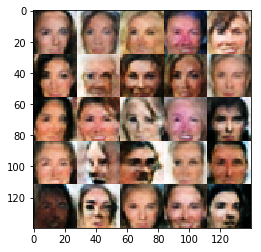

Epoch 6/10... Discriminator Loss: 1.4008... Generator Loss: 0.6898
Epoch 6/10... Discriminator Loss: 1.3909... Generator Loss: 0.6671
Epoch 6/10... Discriminator Loss: 1.4013... Generator Loss: 0.6646
Epoch 6/10... Discriminator Loss: 1.3694... Generator Loss: 0.6828
Epoch 6/10... Discriminator Loss: 1.4042... Generator Loss: 0.7120
Epoch 6/10... Discriminator Loss: 1.4017... Generator Loss: 0.6641
Epoch 6/10... Discriminator Loss: 1.3847... Generator Loss: 0.6781
Epoch 6/10... Discriminator Loss: 1.4137... Generator Loss: 0.6629
Epoch 6/10... Discriminator Loss: 1.3969... Generator Loss: 0.6685
Epoch 6/10... Discriminator Loss: 1.4002... Generator Loss: 0.6774


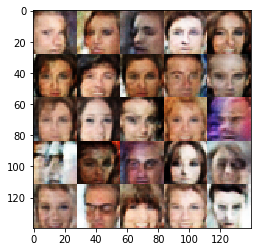

Epoch 6/10... Discriminator Loss: 1.3918... Generator Loss: 0.7288
Epoch 6/10... Discriminator Loss: 1.4155... Generator Loss: 0.6729
Epoch 6/10... Discriminator Loss: 1.3842... Generator Loss: 0.6725
Epoch 6/10... Discriminator Loss: 1.4063... Generator Loss: 0.6589
Epoch 6/10... Discriminator Loss: 1.3871... Generator Loss: 0.6865
Epoch 6/10... Discriminator Loss: 1.3838... Generator Loss: 0.6770
Epoch 6/10... Discriminator Loss: 1.3926... Generator Loss: 0.6760
Epoch 6/10... Discriminator Loss: 1.3933... Generator Loss: 0.6801
Epoch 6/10... Discriminator Loss: 1.3994... Generator Loss: 0.6952
Epoch 7/10... Discriminator Loss: 1.3868... Generator Loss: 0.6579


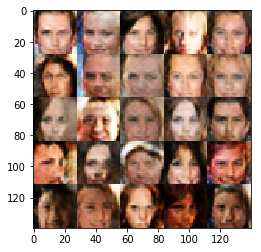

Epoch 7/10... Discriminator Loss: 1.4052... Generator Loss: 0.6846
Epoch 7/10... Discriminator Loss: 1.3837... Generator Loss: 0.7032
Epoch 7/10... Discriminator Loss: 1.3833... Generator Loss: 0.6918
Epoch 7/10... Discriminator Loss: 1.4025... Generator Loss: 0.6637
Epoch 7/10... Discriminator Loss: 1.3946... Generator Loss: 0.6784
Epoch 7/10... Discriminator Loss: 1.3807... Generator Loss: 0.6910
Epoch 7/10... Discriminator Loss: 1.3879... Generator Loss: 0.6960
Epoch 7/10... Discriminator Loss: 1.3913... Generator Loss: 0.6898
Epoch 7/10... Discriminator Loss: 1.3778... Generator Loss: 0.7087
Epoch 7/10... Discriminator Loss: 1.4110... Generator Loss: 0.6503


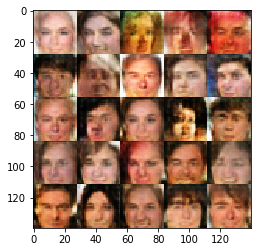

Epoch 7/10... Discriminator Loss: 1.3948... Generator Loss: 0.6505
Epoch 7/10... Discriminator Loss: 1.3761... Generator Loss: 0.6935
Epoch 7/10... Discriminator Loss: 1.3903... Generator Loss: 0.7049
Epoch 7/10... Discriminator Loss: 1.3766... Generator Loss: 0.6692
Epoch 7/10... Discriminator Loss: 1.3874... Generator Loss: 0.6626
Epoch 7/10... Discriminator Loss: 1.3758... Generator Loss: 0.6943
Epoch 7/10... Discriminator Loss: 1.3798... Generator Loss: 0.7024
Epoch 7/10... Discriminator Loss: 1.3804... Generator Loss: 0.6868
Epoch 7/10... Discriminator Loss: 1.3810... Generator Loss: 0.6876
Epoch 7/10... Discriminator Loss: 1.3890... Generator Loss: 0.6442


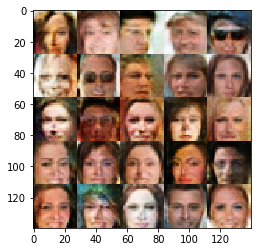

Epoch 7/10... Discriminator Loss: 1.3855... Generator Loss: 0.7230
Epoch 7/10... Discriminator Loss: 1.4112... Generator Loss: 0.6993
Epoch 7/10... Discriminator Loss: 1.3960... Generator Loss: 0.6971
Epoch 7/10... Discriminator Loss: 1.3946... Generator Loss: 0.6597
Epoch 7/10... Discriminator Loss: 1.3868... Generator Loss: 0.6713
Epoch 7/10... Discriminator Loss: 1.3898... Generator Loss: 0.6697
Epoch 7/10... Discriminator Loss: 1.4055... Generator Loss: 0.7469
Epoch 7/10... Discriminator Loss: 1.3865... Generator Loss: 0.6969
Epoch 7/10... Discriminator Loss: 1.3825... Generator Loss: 0.7091
Epoch 7/10... Discriminator Loss: 1.3897... Generator Loss: 0.6627


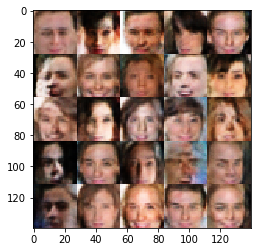

Epoch 7/10... Discriminator Loss: 1.4267... Generator Loss: 0.7000
Epoch 7/10... Discriminator Loss: 1.3885... Generator Loss: 0.6765
Epoch 7/10... Discriminator Loss: 1.3801... Generator Loss: 0.6931
Epoch 7/10... Discriminator Loss: 1.3830... Generator Loss: 0.6865
Epoch 7/10... Discriminator Loss: 1.3926... Generator Loss: 0.6607
Epoch 7/10... Discriminator Loss: 1.3931... Generator Loss: 0.6878
Epoch 7/10... Discriminator Loss: 1.3887... Generator Loss: 0.6962
Epoch 7/10... Discriminator Loss: 1.3741... Generator Loss: 0.7124
Epoch 7/10... Discriminator Loss: 1.3888... Generator Loss: 0.7357
Epoch 7/10... Discriminator Loss: 1.3877... Generator Loss: 0.7012


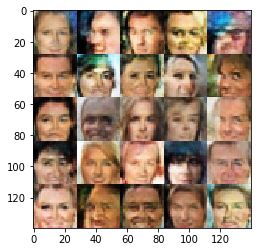

Epoch 7/10... Discriminator Loss: 1.3962... Generator Loss: 0.6707
Epoch 7/10... Discriminator Loss: 1.4043... Generator Loss: 0.6470
Epoch 7/10... Discriminator Loss: 1.3965... Generator Loss: 0.6581
Epoch 7/10... Discriminator Loss: 1.4001... Generator Loss: 0.7002
Epoch 7/10... Discriminator Loss: 1.4098... Generator Loss: 0.6852
Epoch 7/10... Discriminator Loss: 1.4030... Generator Loss: 0.6874
Epoch 7/10... Discriminator Loss: 1.3944... Generator Loss: 0.6831
Epoch 7/10... Discriminator Loss: 1.3915... Generator Loss: 0.6419
Epoch 7/10... Discriminator Loss: 1.4271... Generator Loss: 0.6443
Epoch 7/10... Discriminator Loss: 1.3940... Generator Loss: 0.6752


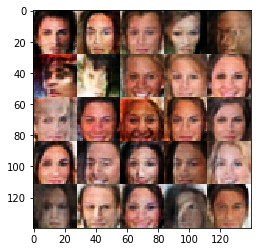

Epoch 7/10... Discriminator Loss: 1.3823... Generator Loss: 0.6789
Epoch 7/10... Discriminator Loss: 1.3805... Generator Loss: 0.6734
Epoch 7/10... Discriminator Loss: 1.4182... Generator Loss: 0.6802
Epoch 7/10... Discriminator Loss: 1.3807... Generator Loss: 0.6730
Epoch 7/10... Discriminator Loss: 1.3986... Generator Loss: 0.6739
Epoch 7/10... Discriminator Loss: 1.3852... Generator Loss: 0.6860
Epoch 7/10... Discriminator Loss: 1.3882... Generator Loss: 0.6582
Epoch 7/10... Discriminator Loss: 1.3970... Generator Loss: 0.6730
Epoch 7/10... Discriminator Loss: 1.4072... Generator Loss: 0.6738
Epoch 7/10... Discriminator Loss: 1.3886... Generator Loss: 0.6663


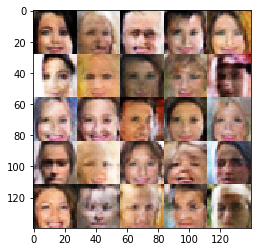

Epoch 7/10... Discriminator Loss: 1.3955... Generator Loss: 0.6775
Epoch 7/10... Discriminator Loss: 1.3919... Generator Loss: 0.6828
Epoch 7/10... Discriminator Loss: 1.3957... Generator Loss: 0.6865
Epoch 7/10... Discriminator Loss: 1.3891... Generator Loss: 0.6730
Epoch 7/10... Discriminator Loss: 1.3826... Generator Loss: 0.7214
Epoch 7/10... Discriminator Loss: 1.3959... Generator Loss: 0.6630
Epoch 7/10... Discriminator Loss: 1.3929... Generator Loss: 0.6684
Epoch 7/10... Discriminator Loss: 1.3943... Generator Loss: 0.6711
Epoch 7/10... Discriminator Loss: 1.3979... Generator Loss: 0.6781
Epoch 7/10... Discriminator Loss: 1.3947... Generator Loss: 0.6736


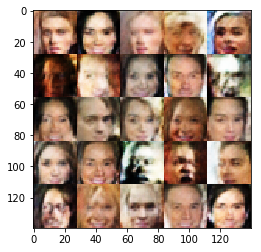

Epoch 7/10... Discriminator Loss: 1.3948... Generator Loss: 0.7115
Epoch 7/10... Discriminator Loss: 1.3735... Generator Loss: 0.6638
Epoch 7/10... Discriminator Loss: 1.3992... Generator Loss: 0.7347
Epoch 7/10... Discriminator Loss: 1.3843... Generator Loss: 0.6911
Epoch 7/10... Discriminator Loss: 1.3835... Generator Loss: 0.6481
Epoch 7/10... Discriminator Loss: 1.3867... Generator Loss: 0.6747
Epoch 7/10... Discriminator Loss: 1.3983... Generator Loss: 0.7085
Epoch 7/10... Discriminator Loss: 1.3866... Generator Loss: 0.6967
Epoch 7/10... Discriminator Loss: 1.4175... Generator Loss: 0.6724
Epoch 7/10... Discriminator Loss: 1.3946... Generator Loss: 0.6711


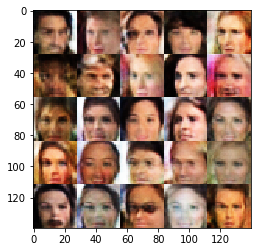

Epoch 7/10... Discriminator Loss: 1.3738... Generator Loss: 0.6902
Epoch 7/10... Discriminator Loss: 1.3795... Generator Loss: 0.6941
Epoch 7/10... Discriminator Loss: 1.3925... Generator Loss: 0.6672
Epoch 7/10... Discriminator Loss: 1.4015... Generator Loss: 0.6978
Epoch 7/10... Discriminator Loss: 1.3952... Generator Loss: 0.6787
Epoch 7/10... Discriminator Loss: 1.3878... Generator Loss: 0.6804
Epoch 7/10... Discriminator Loss: 1.4142... Generator Loss: 0.6513
Epoch 7/10... Discriminator Loss: 1.3760... Generator Loss: 0.6935
Epoch 7/10... Discriminator Loss: 1.3857... Generator Loss: 0.7218
Epoch 7/10... Discriminator Loss: 1.3776... Generator Loss: 0.6865


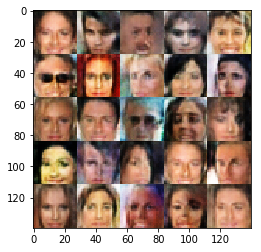

Epoch 7/10... Discriminator Loss: 1.3948... Generator Loss: 0.6941
Epoch 7/10... Discriminator Loss: 1.4112... Generator Loss: 0.6534
Epoch 7/10... Discriminator Loss: 1.3897... Generator Loss: 0.6759
Epoch 7/10... Discriminator Loss: 1.3992... Generator Loss: 0.6942
Epoch 7/10... Discriminator Loss: 1.4023... Generator Loss: 0.6605
Epoch 7/10... Discriminator Loss: 1.3637... Generator Loss: 0.7045
Epoch 7/10... Discriminator Loss: 1.3941... Generator Loss: 0.7103
Epoch 7/10... Discriminator Loss: 1.3982... Generator Loss: 0.6678
Epoch 7/10... Discriminator Loss: 1.3882... Generator Loss: 0.6785
Epoch 7/10... Discriminator Loss: 1.3792... Generator Loss: 0.6879


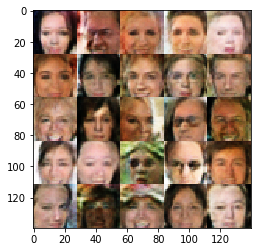

Epoch 7/10... Discriminator Loss: 1.4038... Generator Loss: 0.7143
Epoch 7/10... Discriminator Loss: 1.3967... Generator Loss: 0.7208
Epoch 7/10... Discriminator Loss: 1.4081... Generator Loss: 0.6456
Epoch 7/10... Discriminator Loss: 1.3954... Generator Loss: 0.7041
Epoch 7/10... Discriminator Loss: 1.3970... Generator Loss: 0.6568
Epoch 7/10... Discriminator Loss: 1.3771... Generator Loss: 0.6660
Epoch 7/10... Discriminator Loss: 1.3883... Generator Loss: 0.6620
Epoch 7/10... Discriminator Loss: 1.3841... Generator Loss: 0.6683
Epoch 7/10... Discriminator Loss: 1.3839... Generator Loss: 0.6677
Epoch 7/10... Discriminator Loss: 1.4129... Generator Loss: 0.6251


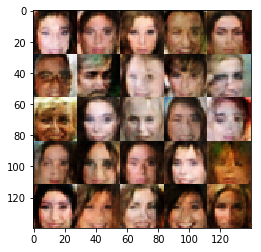

Epoch 7/10... Discriminator Loss: 1.4006... Generator Loss: 0.6363
Epoch 7/10... Discriminator Loss: 1.3863... Generator Loss: 0.6809
Epoch 7/10... Discriminator Loss: 1.3881... Generator Loss: 0.6884
Epoch 7/10... Discriminator Loss: 1.4149... Generator Loss: 0.6350
Epoch 7/10... Discriminator Loss: 1.3838... Generator Loss: 0.6912
Epoch 7/10... Discriminator Loss: 1.4084... Generator Loss: 0.6687
Epoch 7/10... Discriminator Loss: 1.4074... Generator Loss: 0.6876
Epoch 7/10... Discriminator Loss: 1.3891... Generator Loss: 0.6841
Epoch 7/10... Discriminator Loss: 1.4057... Generator Loss: 0.6626
Epoch 7/10... Discriminator Loss: 1.3778... Generator Loss: 0.6833


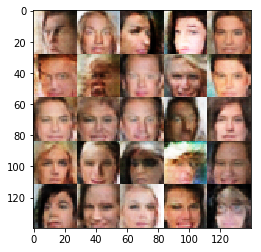

Epoch 7/10... Discriminator Loss: 1.3796... Generator Loss: 0.6696
Epoch 7/10... Discriminator Loss: 1.3752... Generator Loss: 0.7039
Epoch 7/10... Discriminator Loss: 1.3946... Generator Loss: 0.6776
Epoch 7/10... Discriminator Loss: 1.3987... Generator Loss: 0.6507
Epoch 7/10... Discriminator Loss: 1.3790... Generator Loss: 0.6941
Epoch 7/10... Discriminator Loss: 1.3920... Generator Loss: 0.6657
Epoch 7/10... Discriminator Loss: 1.3780... Generator Loss: 0.7010
Epoch 7/10... Discriminator Loss: 1.3926... Generator Loss: 0.7061
Epoch 7/10... Discriminator Loss: 1.3662... Generator Loss: 0.7113
Epoch 7/10... Discriminator Loss: 1.3883... Generator Loss: 0.6903


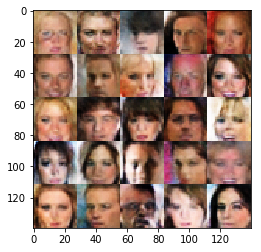

Epoch 7/10... Discriminator Loss: 1.3954... Generator Loss: 0.6446
Epoch 7/10... Discriminator Loss: 1.4033... Generator Loss: 0.6792
Epoch 7/10... Discriminator Loss: 1.3902... Generator Loss: 0.7170
Epoch 7/10... Discriminator Loss: 1.3996... Generator Loss: 0.6697
Epoch 7/10... Discriminator Loss: 1.3801... Generator Loss: 0.6784
Epoch 7/10... Discriminator Loss: 1.3799... Generator Loss: 0.7112
Epoch 7/10... Discriminator Loss: 1.3925... Generator Loss: 0.6993
Epoch 7/10... Discriminator Loss: 1.3948... Generator Loss: 0.6880
Epoch 7/10... Discriminator Loss: 1.4031... Generator Loss: 0.6946
Epoch 7/10... Discriminator Loss: 1.3833... Generator Loss: 0.6941


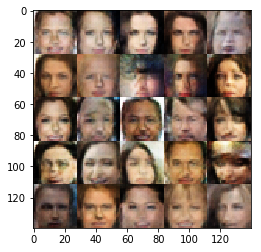

Epoch 7/10... Discriminator Loss: 1.3923... Generator Loss: 0.6768
Epoch 7/10... Discriminator Loss: 1.4049... Generator Loss: 0.6477
Epoch 7/10... Discriminator Loss: 1.3886... Generator Loss: 0.7429
Epoch 7/10... Discriminator Loss: 1.3984... Generator Loss: 0.7084
Epoch 7/10... Discriminator Loss: 1.3987... Generator Loss: 0.6780
Epoch 7/10... Discriminator Loss: 1.3823... Generator Loss: 0.6786
Epoch 7/10... Discriminator Loss: 1.3870... Generator Loss: 0.6650
Epoch 7/10... Discriminator Loss: 1.3889... Generator Loss: 0.6382
Epoch 7/10... Discriminator Loss: 1.3961... Generator Loss: 0.7049
Epoch 7/10... Discriminator Loss: 1.3761... Generator Loss: 0.6901


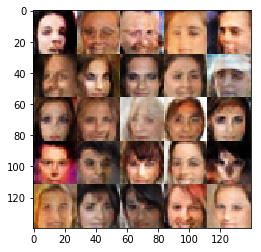

Epoch 7/10... Discriminator Loss: 1.3950... Generator Loss: 0.6883
Epoch 7/10... Discriminator Loss: 1.3849... Generator Loss: 0.6771
Epoch 7/10... Discriminator Loss: 1.4000... Generator Loss: 0.6766
Epoch 7/10... Discriminator Loss: 1.3755... Generator Loss: 0.6955
Epoch 7/10... Discriminator Loss: 1.3874... Generator Loss: 0.6860
Epoch 7/10... Discriminator Loss: 1.3858... Generator Loss: 0.7291
Epoch 7/10... Discriminator Loss: 1.3902... Generator Loss: 0.6810
Epoch 8/10... Discriminator Loss: 1.4015... Generator Loss: 0.6318
Epoch 8/10... Discriminator Loss: 1.3954... Generator Loss: 0.6820
Epoch 8/10... Discriminator Loss: 1.4010... Generator Loss: 0.6736


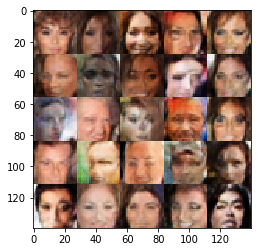

Epoch 8/10... Discriminator Loss: 1.3848... Generator Loss: 0.6894
Epoch 8/10... Discriminator Loss: 1.3911... Generator Loss: 0.7049
Epoch 8/10... Discriminator Loss: 1.3874... Generator Loss: 0.6549
Epoch 8/10... Discriminator Loss: 1.3957... Generator Loss: 0.6560
Epoch 8/10... Discriminator Loss: 1.3936... Generator Loss: 0.6489
Epoch 8/10... Discriminator Loss: 1.4037... Generator Loss: 0.7025
Epoch 8/10... Discriminator Loss: 1.3730... Generator Loss: 0.6745
Epoch 8/10... Discriminator Loss: 1.4022... Generator Loss: 0.6648
Epoch 8/10... Discriminator Loss: 1.4116... Generator Loss: 0.6620
Epoch 8/10... Discriminator Loss: 1.3738... Generator Loss: 0.7049


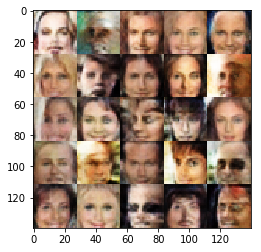

Epoch 8/10... Discriminator Loss: 1.3967... Generator Loss: 0.6713
Epoch 8/10... Discriminator Loss: 1.3994... Generator Loss: 0.7002
Epoch 8/10... Discriminator Loss: 1.3884... Generator Loss: 0.6909
Epoch 8/10... Discriminator Loss: 1.3808... Generator Loss: 0.7118
Epoch 8/10... Discriminator Loss: 1.4036... Generator Loss: 0.6857
Epoch 8/10... Discriminator Loss: 1.3928... Generator Loss: 0.7126
Epoch 8/10... Discriminator Loss: 1.3667... Generator Loss: 0.6914
Epoch 8/10... Discriminator Loss: 1.3996... Generator Loss: 0.6707
Epoch 8/10... Discriminator Loss: 1.3664... Generator Loss: 0.7390
Epoch 8/10... Discriminator Loss: 1.3924... Generator Loss: 0.6883


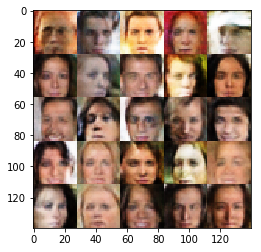

Epoch 8/10... Discriminator Loss: 1.3769... Generator Loss: 0.6845
Epoch 8/10... Discriminator Loss: 1.4074... Generator Loss: 0.6442
Epoch 8/10... Discriminator Loss: 1.3825... Generator Loss: 0.7058
Epoch 8/10... Discriminator Loss: 1.3925... Generator Loss: 0.7018
Epoch 8/10... Discriminator Loss: 1.3759... Generator Loss: 0.6738
Epoch 8/10... Discriminator Loss: 1.3858... Generator Loss: 0.6946
Epoch 8/10... Discriminator Loss: 1.3971... Generator Loss: 0.6469
Epoch 8/10... Discriminator Loss: 1.3745... Generator Loss: 0.6705
Epoch 8/10... Discriminator Loss: 1.4069... Generator Loss: 0.6615
Epoch 8/10... Discriminator Loss: 1.3776... Generator Loss: 0.6878


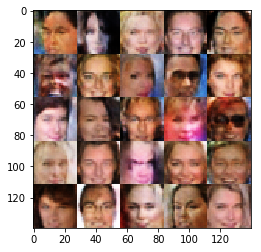

Epoch 8/10... Discriminator Loss: 1.3847... Generator Loss: 0.6812
Epoch 8/10... Discriminator Loss: 1.3813... Generator Loss: 0.6823
Epoch 8/10... Discriminator Loss: 1.3609... Generator Loss: 0.7157
Epoch 8/10... Discriminator Loss: 1.3788... Generator Loss: 0.6996
Epoch 8/10... Discriminator Loss: 1.3839... Generator Loss: 0.6965
Epoch 8/10... Discriminator Loss: 1.3783... Generator Loss: 0.6829
Epoch 8/10... Discriminator Loss: 1.3661... Generator Loss: 0.6852
Epoch 8/10... Discriminator Loss: 1.4124... Generator Loss: 0.6913
Epoch 8/10... Discriminator Loss: 1.3985... Generator Loss: 0.6513
Epoch 8/10... Discriminator Loss: 1.4090... Generator Loss: 0.6121


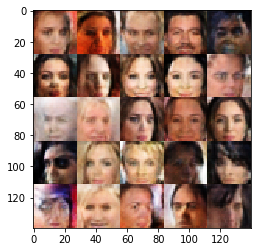

Epoch 8/10... Discriminator Loss: 1.3672... Generator Loss: 0.6780
Epoch 8/10... Discriminator Loss: 1.3864... Generator Loss: 0.6819
Epoch 8/10... Discriminator Loss: 1.3654... Generator Loss: 0.6547
Epoch 8/10... Discriminator Loss: 1.3754... Generator Loss: 0.6918
Epoch 8/10... Discriminator Loss: 1.3850... Generator Loss: 0.6870
Epoch 8/10... Discriminator Loss: 1.4056... Generator Loss: 0.5981
Epoch 8/10... Discriminator Loss: 1.4102... Generator Loss: 0.6400
Epoch 8/10... Discriminator Loss: 1.3741... Generator Loss: 0.6671
Epoch 8/10... Discriminator Loss: 1.3668... Generator Loss: 0.7195
Epoch 8/10... Discriminator Loss: 1.3582... Generator Loss: 0.6897


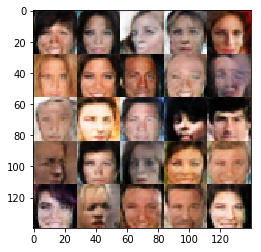

Epoch 8/10... Discriminator Loss: 1.4099... Generator Loss: 0.7338
Epoch 8/10... Discriminator Loss: 1.3996... Generator Loss: 0.7321
Epoch 8/10... Discriminator Loss: 1.3804... Generator Loss: 0.6581
Epoch 8/10... Discriminator Loss: 1.3904... Generator Loss: 0.6858
Epoch 8/10... Discriminator Loss: 1.3859... Generator Loss: 0.6602
Epoch 8/10... Discriminator Loss: 1.3485... Generator Loss: 0.6978
Epoch 8/10... Discriminator Loss: 1.3775... Generator Loss: 0.6542
Epoch 8/10... Discriminator Loss: 1.3825... Generator Loss: 0.6864
Epoch 8/10... Discriminator Loss: 1.4129... Generator Loss: 0.6377
Epoch 8/10... Discriminator Loss: 1.3855... Generator Loss: 0.6827


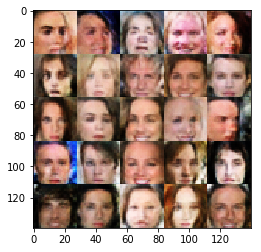

Epoch 8/10... Discriminator Loss: 1.4015... Generator Loss: 0.6784
Epoch 8/10... Discriminator Loss: 1.3872... Generator Loss: 0.7185
Epoch 8/10... Discriminator Loss: 1.3415... Generator Loss: 0.7301
Epoch 8/10... Discriminator Loss: 1.3855... Generator Loss: 0.7081
Epoch 8/10... Discriminator Loss: 1.3850... Generator Loss: 0.6852
Epoch 8/10... Discriminator Loss: 1.3835... Generator Loss: 0.6693
Epoch 8/10... Discriminator Loss: 1.4259... Generator Loss: 0.5599
Epoch 8/10... Discriminator Loss: 1.4008... Generator Loss: 0.6529
Epoch 8/10... Discriminator Loss: 1.4070... Generator Loss: 0.6779
Epoch 8/10... Discriminator Loss: 1.3869... Generator Loss: 0.6757


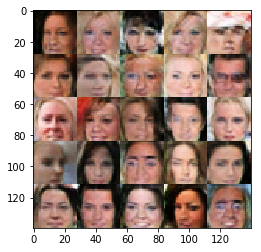

Epoch 8/10... Discriminator Loss: 1.3858... Generator Loss: 0.6900
Epoch 8/10... Discriminator Loss: 1.3990... Generator Loss: 0.7029
Epoch 8/10... Discriminator Loss: 1.3789... Generator Loss: 0.6171
Epoch 8/10... Discriminator Loss: 1.3949... Generator Loss: 0.6472
Epoch 8/10... Discriminator Loss: 1.3886... Generator Loss: 0.7002
Epoch 8/10... Discriminator Loss: 1.4257... Generator Loss: 0.6442
Epoch 8/10... Discriminator Loss: 1.3831... Generator Loss: 0.7229
Epoch 8/10... Discriminator Loss: 1.3897... Generator Loss: 0.6910
Epoch 8/10... Discriminator Loss: 1.3827... Generator Loss: 0.6776
Epoch 8/10... Discriminator Loss: 1.3851... Generator Loss: 0.6831


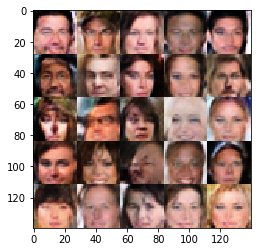

Epoch 8/10... Discriminator Loss: 1.3747... Generator Loss: 0.7013
Epoch 8/10... Discriminator Loss: 1.3924... Generator Loss: 0.7360
Epoch 8/10... Discriminator Loss: 1.4096... Generator Loss: 0.6798
Epoch 8/10... Discriminator Loss: 1.3659... Generator Loss: 0.7024
Epoch 8/10... Discriminator Loss: 1.4067... Generator Loss: 0.6527
Epoch 8/10... Discriminator Loss: 1.3929... Generator Loss: 0.6550
Epoch 8/10... Discriminator Loss: 1.3871... Generator Loss: 0.6630
Epoch 8/10... Discriminator Loss: 1.3684... Generator Loss: 0.6596
Epoch 8/10... Discriminator Loss: 1.4245... Generator Loss: 0.6242
Epoch 8/10... Discriminator Loss: 1.3915... Generator Loss: 0.6585


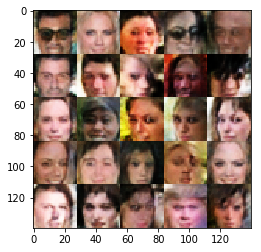

Epoch 8/10... Discriminator Loss: 1.3774... Generator Loss: 0.6982
Epoch 8/10... Discriminator Loss: 1.3758... Generator Loss: 0.6832
Epoch 8/10... Discriminator Loss: 1.3897... Generator Loss: 0.7236
Epoch 8/10... Discriminator Loss: 1.3834... Generator Loss: 0.6917
Epoch 8/10... Discriminator Loss: 1.3766... Generator Loss: 0.6906
Epoch 8/10... Discriminator Loss: 1.3986... Generator Loss: 0.6583
Epoch 8/10... Discriminator Loss: 1.3835... Generator Loss: 0.6503
Epoch 8/10... Discriminator Loss: 1.3770... Generator Loss: 0.7082
Epoch 8/10... Discriminator Loss: 1.4093... Generator Loss: 0.6511
Epoch 8/10... Discriminator Loss: 1.3982... Generator Loss: 0.6218


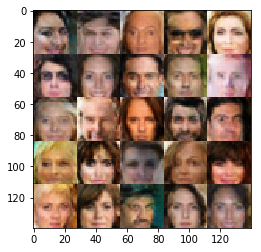

Epoch 8/10... Discriminator Loss: 1.3337... Generator Loss: 0.6515
Epoch 8/10... Discriminator Loss: 1.3975... Generator Loss: 0.6575
Epoch 8/10... Discriminator Loss: 1.4107... Generator Loss: 0.6793
Epoch 8/10... Discriminator Loss: 1.4343... Generator Loss: 0.6330
Epoch 8/10... Discriminator Loss: 1.3506... Generator Loss: 0.6832
Epoch 8/10... Discriminator Loss: 1.4075... Generator Loss: 0.6782
Epoch 8/10... Discriminator Loss: 1.3922... Generator Loss: 0.6746
Epoch 8/10... Discriminator Loss: 1.3948... Generator Loss: 0.7039
Epoch 8/10... Discriminator Loss: 1.3900... Generator Loss: 0.6643
Epoch 8/10... Discriminator Loss: 1.3815... Generator Loss: 0.6671


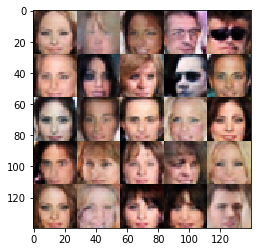

Epoch 8/10... Discriminator Loss: 1.3853... Generator Loss: 0.6853
Epoch 8/10... Discriminator Loss: 1.3922... Generator Loss: 0.6529
Epoch 8/10... Discriminator Loss: 1.3152... Generator Loss: 0.7565
Epoch 8/10... Discriminator Loss: 1.3704... Generator Loss: 0.7066
Epoch 8/10... Discriminator Loss: 1.3764... Generator Loss: 0.6746
Epoch 8/10... Discriminator Loss: 1.3925... Generator Loss: 0.6662
Epoch 8/10... Discriminator Loss: 1.3670... Generator Loss: 0.6504
Epoch 8/10... Discriminator Loss: 1.4016... Generator Loss: 0.6437
Epoch 8/10... Discriminator Loss: 1.3849... Generator Loss: 0.6940
Epoch 8/10... Discriminator Loss: 1.3870... Generator Loss: 0.6539


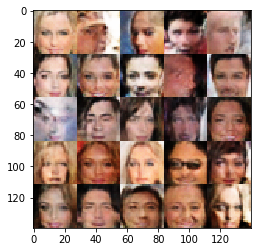

Epoch 8/10... Discriminator Loss: 1.4186... Generator Loss: 0.7082
Epoch 8/10... Discriminator Loss: 1.3952... Generator Loss: 0.6445
Epoch 8/10... Discriminator Loss: 1.3666... Generator Loss: 0.7267
Epoch 8/10... Discriminator Loss: 1.3665... Generator Loss: 0.6860
Epoch 8/10... Discriminator Loss: 1.4008... Generator Loss: 0.7085
Epoch 8/10... Discriminator Loss: 1.3905... Generator Loss: 0.6485
Epoch 8/10... Discriminator Loss: 1.3537... Generator Loss: 0.7105
Epoch 8/10... Discriminator Loss: 1.3484... Generator Loss: 0.7089
Epoch 8/10... Discriminator Loss: 1.3845... Generator Loss: 0.6781
Epoch 8/10... Discriminator Loss: 1.3884... Generator Loss: 0.7161


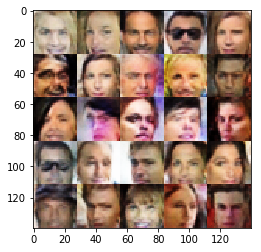

Epoch 8/10... Discriminator Loss: 1.3817... Generator Loss: 0.7112
Epoch 8/10... Discriminator Loss: 1.3705... Generator Loss: 0.7116
Epoch 8/10... Discriminator Loss: 1.3964... Generator Loss: 0.6596
Epoch 8/10... Discriminator Loss: 1.3531... Generator Loss: 0.6335
Epoch 8/10... Discriminator Loss: 1.3783... Generator Loss: 0.6489
Epoch 8/10... Discriminator Loss: 1.3968... Generator Loss: 0.6394
Epoch 8/10... Discriminator Loss: 1.3620... Generator Loss: 0.6935
Epoch 8/10... Discriminator Loss: 1.3725... Generator Loss: 0.6851
Epoch 8/10... Discriminator Loss: 1.3854... Generator Loss: 0.6537
Epoch 8/10... Discriminator Loss: 1.3695... Generator Loss: 0.7193


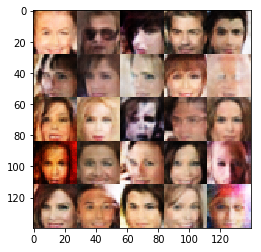

Epoch 8/10... Discriminator Loss: 1.4008... Generator Loss: 0.6596
Epoch 8/10... Discriminator Loss: 1.3359... Generator Loss: 0.7031
Epoch 8/10... Discriminator Loss: 1.3645... Generator Loss: 0.7044
Epoch 8/10... Discriminator Loss: 1.4092... Generator Loss: 0.6647
Epoch 8/10... Discriminator Loss: 1.3880... Generator Loss: 0.7198
Epoch 8/10... Discriminator Loss: 1.4161... Generator Loss: 0.6681
Epoch 8/10... Discriminator Loss: 1.3199... Generator Loss: 0.6941
Epoch 8/10... Discriminator Loss: 1.3588... Generator Loss: 0.6534
Epoch 8/10... Discriminator Loss: 1.3766... Generator Loss: 0.6671
Epoch 8/10... Discriminator Loss: 1.3999... Generator Loss: 0.7295


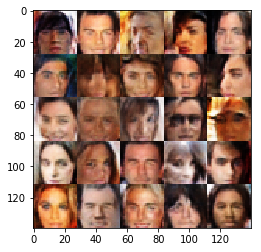

Epoch 8/10... Discriminator Loss: 1.3472... Generator Loss: 0.6533
Epoch 8/10... Discriminator Loss: 1.4137... Generator Loss: 0.6383
Epoch 8/10... Discriminator Loss: 1.3508... Generator Loss: 0.7387
Epoch 8/10... Discriminator Loss: 1.3564... Generator Loss: 0.7302
Epoch 8/10... Discriminator Loss: 1.3569... Generator Loss: 0.6885
Epoch 9/10... Discriminator Loss: 1.4582... Generator Loss: 0.6157
Epoch 9/10... Discriminator Loss: 1.3931... Generator Loss: 0.6705
Epoch 9/10... Discriminator Loss: 1.3726... Generator Loss: 0.6695
Epoch 9/10... Discriminator Loss: 1.3658... Generator Loss: 0.6779
Epoch 9/10... Discriminator Loss: 1.3780... Generator Loss: 0.6820


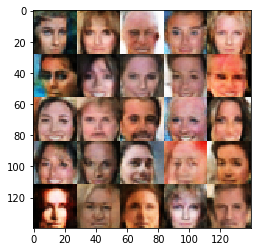

Epoch 9/10... Discriminator Loss: 1.3897... Generator Loss: 0.6273
Epoch 9/10... Discriminator Loss: 1.3786... Generator Loss: 0.6655
Epoch 9/10... Discriminator Loss: 1.3730... Generator Loss: 0.6739
Epoch 9/10... Discriminator Loss: 1.3758... Generator Loss: 0.6684
Epoch 9/10... Discriminator Loss: 1.3657... Generator Loss: 0.7063
Epoch 9/10... Discriminator Loss: 1.4086... Generator Loss: 0.6441
Epoch 9/10... Discriminator Loss: 1.3733... Generator Loss: 0.6685
Epoch 9/10... Discriminator Loss: 1.3548... Generator Loss: 0.7135
Epoch 9/10... Discriminator Loss: 1.3560... Generator Loss: 0.6962
Epoch 9/10... Discriminator Loss: 1.2970... Generator Loss: 0.7380


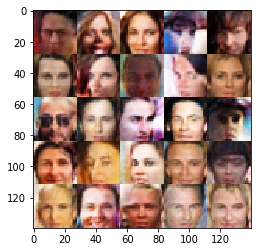

Epoch 9/10... Discriminator Loss: 1.3990... Generator Loss: 0.7212
Epoch 9/10... Discriminator Loss: 1.3674... Generator Loss: 0.6322
Epoch 9/10... Discriminator Loss: 1.3832... Generator Loss: 0.6337
Epoch 9/10... Discriminator Loss: 1.4049... Generator Loss: 0.6587
Epoch 9/10... Discriminator Loss: 1.4203... Generator Loss: 0.6766
Epoch 9/10... Discriminator Loss: 1.3716... Generator Loss: 0.6060
Epoch 9/10... Discriminator Loss: 1.3140... Generator Loss: 0.7218
Epoch 9/10... Discriminator Loss: 1.3955... Generator Loss: 0.6672
Epoch 9/10... Discriminator Loss: 1.3792... Generator Loss: 0.6753
Epoch 9/10... Discriminator Loss: 1.3781... Generator Loss: 0.6548


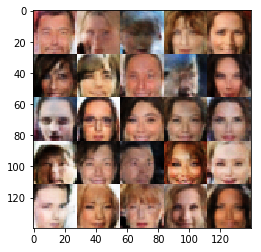

Epoch 9/10... Discriminator Loss: 1.3617... Generator Loss: 0.6917
Epoch 9/10... Discriminator Loss: 1.4097... Generator Loss: 0.6480
Epoch 9/10... Discriminator Loss: 1.3742... Generator Loss: 0.6558
Epoch 9/10... Discriminator Loss: 1.3665... Generator Loss: 0.6653
Epoch 9/10... Discriminator Loss: 1.3447... Generator Loss: 0.6698
Epoch 9/10... Discriminator Loss: 1.4056... Generator Loss: 0.6681
Epoch 9/10... Discriminator Loss: 1.4028... Generator Loss: 0.6015
Epoch 9/10... Discriminator Loss: 1.4797... Generator Loss: 0.5732
Epoch 9/10... Discriminator Loss: 1.3867... Generator Loss: 0.6745
Epoch 9/10... Discriminator Loss: 1.3479... Generator Loss: 0.7308


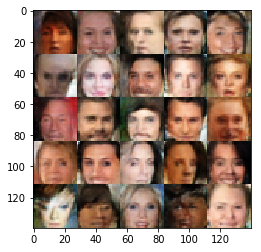

Epoch 9/10... Discriminator Loss: 1.3713... Generator Loss: 0.6965
Epoch 9/10... Discriminator Loss: 1.3816... Generator Loss: 0.6744
Epoch 9/10... Discriminator Loss: 1.3812... Generator Loss: 0.6560
Epoch 9/10... Discriminator Loss: 1.3772... Generator Loss: 0.6677
Epoch 9/10... Discriminator Loss: 1.3630... Generator Loss: 0.7017
Epoch 9/10... Discriminator Loss: 1.3743... Generator Loss: 0.6712
Epoch 9/10... Discriminator Loss: 1.3679... Generator Loss: 0.7072
Epoch 9/10... Discriminator Loss: 1.3705... Generator Loss: 0.6474
Epoch 9/10... Discriminator Loss: 1.3930... Generator Loss: 0.7099
Epoch 9/10... Discriminator Loss: 1.3816... Generator Loss: 0.6827


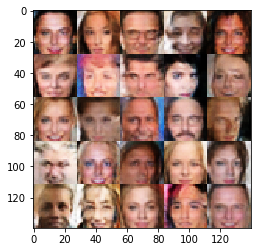

Epoch 9/10... Discriminator Loss: 1.3770... Generator Loss: 0.6712
Epoch 9/10... Discriminator Loss: 1.3175... Generator Loss: 0.7330
Epoch 9/10... Discriminator Loss: 1.4224... Generator Loss: 0.5738
Epoch 9/10... Discriminator Loss: 1.4033... Generator Loss: 0.6314
Epoch 9/10... Discriminator Loss: 1.3547... Generator Loss: 0.7528
Epoch 9/10... Discriminator Loss: 1.3137... Generator Loss: 0.6891
Epoch 9/10... Discriminator Loss: 1.3816... Generator Loss: 0.5519
Epoch 9/10... Discriminator Loss: 1.4007... Generator Loss: 0.6258
Epoch 9/10... Discriminator Loss: 1.3686... Generator Loss: 0.7536
Epoch 9/10... Discriminator Loss: 1.3920... Generator Loss: 0.6210


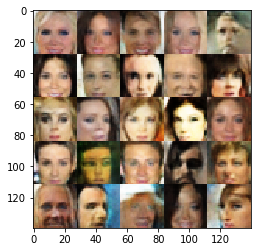

Epoch 9/10... Discriminator Loss: 1.3336... Generator Loss: 0.6306
Epoch 9/10... Discriminator Loss: 1.3230... Generator Loss: 0.7173
Epoch 9/10... Discriminator Loss: 1.3685... Generator Loss: 0.7017
Epoch 9/10... Discriminator Loss: 1.3307... Generator Loss: 0.6906
Epoch 9/10... Discriminator Loss: 1.3890... Generator Loss: 0.5610
Epoch 9/10... Discriminator Loss: 1.3901... Generator Loss: 0.7687
Epoch 9/10... Discriminator Loss: 1.3359... Generator Loss: 0.7247
Epoch 9/10... Discriminator Loss: 1.3922... Generator Loss: 0.6576
Epoch 9/10... Discriminator Loss: 1.4017... Generator Loss: 0.5645
Epoch 9/10... Discriminator Loss: 1.3759... Generator Loss: 0.6386


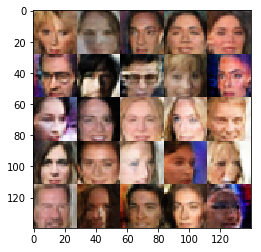

Epoch 9/10... Discriminator Loss: 1.4164... Generator Loss: 0.6029
Epoch 9/10... Discriminator Loss: 1.3350... Generator Loss: 0.7372
Epoch 9/10... Discriminator Loss: 1.4258... Generator Loss: 0.6203
Epoch 9/10... Discriminator Loss: 1.3761... Generator Loss: 0.6450
Epoch 9/10... Discriminator Loss: 1.4375... Generator Loss: 0.6640
Epoch 9/10... Discriminator Loss: 1.4556... Generator Loss: 0.6779
Epoch 9/10... Discriminator Loss: 1.4410... Generator Loss: 0.5194
Epoch 9/10... Discriminator Loss: 1.3790... Generator Loss: 0.7346
Epoch 9/10... Discriminator Loss: 1.3650... Generator Loss: 0.7334
Epoch 9/10... Discriminator Loss: 1.3985... Generator Loss: 0.5802


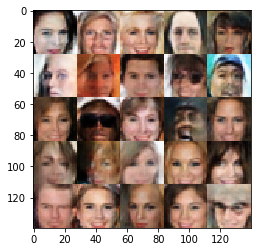

Epoch 9/10... Discriminator Loss: 1.4283... Generator Loss: 0.5796
Epoch 9/10... Discriminator Loss: 1.3612... Generator Loss: 0.7207
Epoch 9/10... Discriminator Loss: 1.3562... Generator Loss: 0.6281
Epoch 9/10... Discriminator Loss: 1.3366... Generator Loss: 0.6808
Epoch 9/10... Discriminator Loss: 1.3489... Generator Loss: 0.6542
Epoch 9/10... Discriminator Loss: 1.3448... Generator Loss: 0.5918
Epoch 9/10... Discriminator Loss: 1.3629... Generator Loss: 0.6496
Epoch 9/10... Discriminator Loss: 1.3636... Generator Loss: 0.6851
Epoch 9/10... Discriminator Loss: 1.3215... Generator Loss: 0.6893
Epoch 9/10... Discriminator Loss: 1.4051... Generator Loss: 0.6374


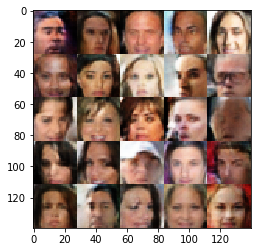

Epoch 9/10... Discriminator Loss: 1.3856... Generator Loss: 0.6287
Epoch 9/10... Discriminator Loss: 1.4170... Generator Loss: 0.6452
Epoch 9/10... Discriminator Loss: 1.3922... Generator Loss: 0.6203
Epoch 9/10... Discriminator Loss: 1.4380... Generator Loss: 0.6191
Epoch 9/10... Discriminator Loss: 1.4039... Generator Loss: 0.5640
Epoch 9/10... Discriminator Loss: 1.4004... Generator Loss: 0.6086
Epoch 9/10... Discriminator Loss: 1.3835... Generator Loss: 0.6335
Epoch 9/10... Discriminator Loss: 1.3535... Generator Loss: 0.6427
Epoch 9/10... Discriminator Loss: 1.2642... Generator Loss: 0.7491
Epoch 9/10... Discriminator Loss: 1.3725... Generator Loss: 0.6801


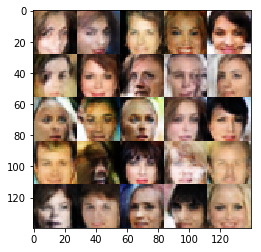

Epoch 9/10... Discriminator Loss: 1.4093... Generator Loss: 0.5240
Epoch 9/10... Discriminator Loss: 1.3524... Generator Loss: 0.7033
Epoch 9/10... Discriminator Loss: 1.3338... Generator Loss: 0.7128
Epoch 9/10... Discriminator Loss: 1.4456... Generator Loss: 0.5485
Epoch 9/10... Discriminator Loss: 1.3082... Generator Loss: 0.6472
Epoch 9/10... Discriminator Loss: 1.3129... Generator Loss: 0.8126
Epoch 9/10... Discriminator Loss: 1.4276... Generator Loss: 0.5554
Epoch 9/10... Discriminator Loss: 1.3534... Generator Loss: 0.6988
Epoch 9/10... Discriminator Loss: 1.4177... Generator Loss: 0.5596
Epoch 9/10... Discriminator Loss: 1.4015... Generator Loss: 0.5653


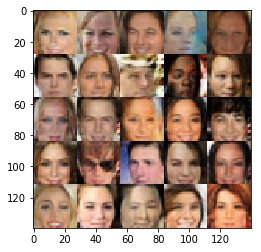

Epoch 9/10... Discriminator Loss: 1.3450... Generator Loss: 0.6308
Epoch 9/10... Discriminator Loss: 1.4737... Generator Loss: 0.5674
Epoch 9/10... Discriminator Loss: 1.3667... Generator Loss: 0.7836
Epoch 9/10... Discriminator Loss: 1.3516... Generator Loss: 0.8121
Epoch 9/10... Discriminator Loss: 1.3688... Generator Loss: 0.6078
Epoch 9/10... Discriminator Loss: 1.3639... Generator Loss: 0.8205
Epoch 9/10... Discriminator Loss: 1.3481... Generator Loss: 0.5961
Epoch 9/10... Discriminator Loss: 1.4196... Generator Loss: 0.6381
Epoch 9/10... Discriminator Loss: 1.3044... Generator Loss: 0.6337
Epoch 9/10... Discriminator Loss: 1.3325... Generator Loss: 0.7324


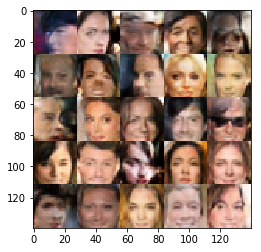

Epoch 9/10... Discriminator Loss: 1.3102... Generator Loss: 0.6965
Epoch 9/10... Discriminator Loss: 1.3945... Generator Loss: 0.6094
Epoch 9/10... Discriminator Loss: 1.4165... Generator Loss: 0.8291
Epoch 9/10... Discriminator Loss: 1.3381... Generator Loss: 0.6798
Epoch 9/10... Discriminator Loss: 1.4047... Generator Loss: 0.6745
Epoch 9/10... Discriminator Loss: 1.3150... Generator Loss: 0.6775
Epoch 9/10... Discriminator Loss: 1.3344... Generator Loss: 0.6616
Epoch 9/10... Discriminator Loss: 1.4035... Generator Loss: 0.6955
Epoch 9/10... Discriminator Loss: 1.3379... Generator Loss: 0.7300
Epoch 9/10... Discriminator Loss: 1.3445... Generator Loss: 0.7500


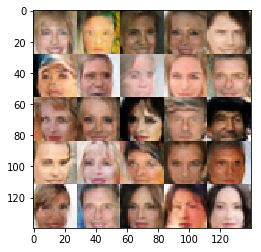

Epoch 9/10... Discriminator Loss: 1.4065... Generator Loss: 0.6447
Epoch 9/10... Discriminator Loss: 1.3607... Generator Loss: 0.6955
Epoch 9/10... Discriminator Loss: 1.2818... Generator Loss: 0.7688
Epoch 9/10... Discriminator Loss: 1.2645... Generator Loss: 0.7374
Epoch 9/10... Discriminator Loss: 1.3619... Generator Loss: 0.6211
Epoch 9/10... Discriminator Loss: 1.3427... Generator Loss: 0.7571
Epoch 9/10... Discriminator Loss: 1.4056... Generator Loss: 0.7111
Epoch 9/10... Discriminator Loss: 1.3130... Generator Loss: 0.6602
Epoch 9/10... Discriminator Loss: 1.3457... Generator Loss: 0.7031
Epoch 9/10... Discriminator Loss: 1.3646... Generator Loss: 0.6469


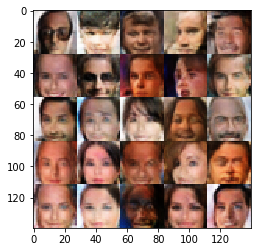

Epoch 9/10... Discriminator Loss: 1.4344... Generator Loss: 0.5773
Epoch 9/10... Discriminator Loss: 1.3039... Generator Loss: 0.6516
Epoch 9/10... Discriminator Loss: 1.4126... Generator Loss: 0.7255
Epoch 9/10... Discriminator Loss: 1.3936... Generator Loss: 0.6040
Epoch 9/10... Discriminator Loss: 1.3403... Generator Loss: 0.7615
Epoch 9/10... Discriminator Loss: 1.2926... Generator Loss: 0.6696
Epoch 9/10... Discriminator Loss: 1.3548... Generator Loss: 0.7548
Epoch 9/10... Discriminator Loss: 1.3486... Generator Loss: 0.7206
Epoch 9/10... Discriminator Loss: 1.3888... Generator Loss: 0.6119
Epoch 9/10... Discriminator Loss: 1.3965... Generator Loss: 0.6995
Epoch 9/10... Discriminator Loss: 1.4566... Generator Loss: 0.5308
Epoch 9/10... Discriminator Loss: 1.3374... Generator Loss: 0.6598
Epoch 9/10... Discriminator Loss: 1.3247... Generator Loss: 0.7379
Epoch 9/10... Discriminator Loss: 1.4115... Generator Loss: 0.7463
Epoch 9/10... Discriminator Loss: 1.3756... Generator Loss: 0.

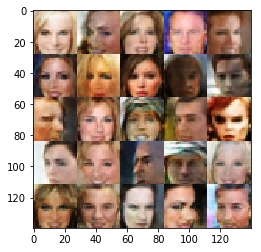

Epoch 9/10... Discriminator Loss: 1.3539... Generator Loss: 0.6732
Epoch 9/10... Discriminator Loss: 1.3598... Generator Loss: 0.5890
Epoch 9/10... Discriminator Loss: 1.3865... Generator Loss: 0.5481
Epoch 10/10... Discriminator Loss: 1.3614... Generator Loss: 0.6513
Epoch 10/10... Discriminator Loss: 1.2927... Generator Loss: 0.7726
Epoch 10/10... Discriminator Loss: 1.2858... Generator Loss: 0.6276
Epoch 10/10... Discriminator Loss: 1.3885... Generator Loss: 0.6015
Epoch 10/10... Discriminator Loss: 1.3556... Generator Loss: 0.7004
Epoch 10/10... Discriminator Loss: 1.3276... Generator Loss: 0.7116
Epoch 10/10... Discriminator Loss: 1.3882... Generator Loss: 0.6612


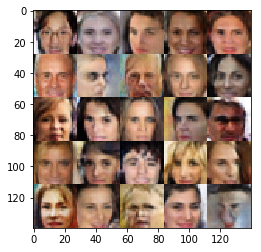

Epoch 10/10... Discriminator Loss: 1.2721... Generator Loss: 0.7707
Epoch 10/10... Discriminator Loss: 1.3878... Generator Loss: 0.6374
Epoch 10/10... Discriminator Loss: 1.3857... Generator Loss: 0.7113
Epoch 10/10... Discriminator Loss: 1.4912... Generator Loss: 0.4878
Epoch 10/10... Discriminator Loss: 1.2905... Generator Loss: 0.7168
Epoch 10/10... Discriminator Loss: 1.3473... Generator Loss: 0.6464
Epoch 10/10... Discriminator Loss: 1.4440... Generator Loss: 0.6034
Epoch 10/10... Discriminator Loss: 1.3828... Generator Loss: 0.6085
Epoch 10/10... Discriminator Loss: 1.3981... Generator Loss: 0.6608
Epoch 10/10... Discriminator Loss: 1.3094... Generator Loss: 0.6714


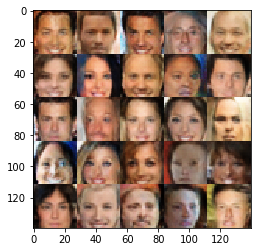

Epoch 10/10... Discriminator Loss: 1.4010... Generator Loss: 0.6716
Epoch 10/10... Discriminator Loss: 1.4056... Generator Loss: 0.6545
Epoch 10/10... Discriminator Loss: 1.2566... Generator Loss: 0.6899
Epoch 10/10... Discriminator Loss: 1.3165... Generator Loss: 0.8884
Epoch 10/10... Discriminator Loss: 1.3868... Generator Loss: 0.7593
Epoch 10/10... Discriminator Loss: 1.3879... Generator Loss: 0.5679
Epoch 10/10... Discriminator Loss: 1.4009... Generator Loss: 0.5690
Epoch 10/10... Discriminator Loss: 1.2073... Generator Loss: 0.7257
Epoch 10/10... Discriminator Loss: 1.3770... Generator Loss: 0.6083
Epoch 10/10... Discriminator Loss: 1.3321... Generator Loss: 0.6907


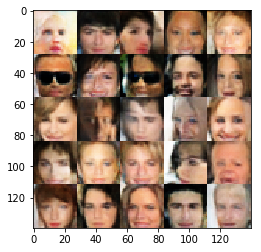

Epoch 10/10... Discriminator Loss: 1.3967... Generator Loss: 0.5804
Epoch 10/10... Discriminator Loss: 1.3672... Generator Loss: 0.7393
Epoch 10/10... Discriminator Loss: 1.3128... Generator Loss: 0.6130
Epoch 10/10... Discriminator Loss: 1.2744... Generator Loss: 0.6895
Epoch 10/10... Discriminator Loss: 1.2456... Generator Loss: 0.8897
Epoch 10/10... Discriminator Loss: 1.3202... Generator Loss: 0.6657
Epoch 10/10... Discriminator Loss: 1.3101... Generator Loss: 0.6771
Epoch 10/10... Discriminator Loss: 1.3456... Generator Loss: 0.6368
Epoch 10/10... Discriminator Loss: 1.2843... Generator Loss: 0.6397
Epoch 10/10... Discriminator Loss: 1.4057... Generator Loss: 0.6115


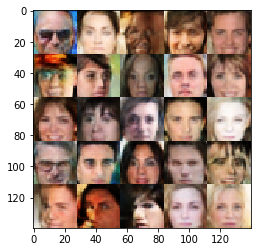

Epoch 10/10... Discriminator Loss: 1.3170... Generator Loss: 0.8661
Epoch 10/10... Discriminator Loss: 1.3353... Generator Loss: 0.6367
Epoch 10/10... Discriminator Loss: 1.3542... Generator Loss: 0.6705
Epoch 10/10... Discriminator Loss: 1.3037... Generator Loss: 0.6063
Epoch 10/10... Discriminator Loss: 1.3317... Generator Loss: 0.7118
Epoch 10/10... Discriminator Loss: 1.5177... Generator Loss: 0.4588
Epoch 10/10... Discriminator Loss: 1.3600... Generator Loss: 0.7190
Epoch 10/10... Discriminator Loss: 1.4467... Generator Loss: 0.4937
Epoch 10/10... Discriminator Loss: 1.4237... Generator Loss: 0.6652
Epoch 10/10... Discriminator Loss: 1.3603... Generator Loss: 0.6183


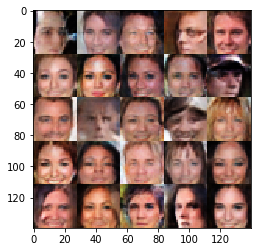

Epoch 10/10... Discriminator Loss: 1.3094... Generator Loss: 0.6616
Epoch 10/10... Discriminator Loss: 1.2383... Generator Loss: 0.7054
Epoch 10/10... Discriminator Loss: 1.4220... Generator Loss: 0.5276
Epoch 10/10... Discriminator Loss: 1.2956... Generator Loss: 0.6675
Epoch 10/10... Discriminator Loss: 1.3758... Generator Loss: 0.6742
Epoch 10/10... Discriminator Loss: 1.3429... Generator Loss: 0.6897
Epoch 10/10... Discriminator Loss: 1.3790... Generator Loss: 0.6412
Epoch 10/10... Discriminator Loss: 1.4154... Generator Loss: 0.5345
Epoch 10/10... Discriminator Loss: 1.3457... Generator Loss: 0.5747
Epoch 10/10... Discriminator Loss: 1.2977... Generator Loss: 0.7504


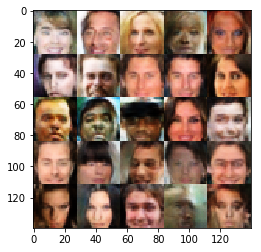

Epoch 10/10... Discriminator Loss: 1.3404... Generator Loss: 0.5986
Epoch 10/10... Discriminator Loss: 1.4450... Generator Loss: 0.5640
Epoch 10/10... Discriminator Loss: 1.3058... Generator Loss: 0.6211
Epoch 10/10... Discriminator Loss: 1.3952... Generator Loss: 0.6685
Epoch 10/10... Discriminator Loss: 1.3636... Generator Loss: 0.6294
Epoch 10/10... Discriminator Loss: 1.3181... Generator Loss: 0.6218
Epoch 10/10... Discriminator Loss: 1.3126... Generator Loss: 0.6973
Epoch 10/10... Discriminator Loss: 1.2921... Generator Loss: 0.7843
Epoch 10/10... Discriminator Loss: 1.3534... Generator Loss: 0.5656
Epoch 10/10... Discriminator Loss: 1.4015... Generator Loss: 0.7041


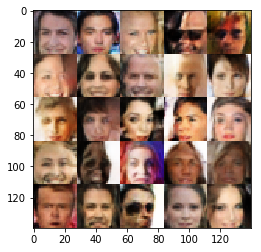

Epoch 10/10... Discriminator Loss: 1.4118... Generator Loss: 0.5419
Epoch 10/10... Discriminator Loss: 1.3516... Generator Loss: 0.7047
Epoch 10/10... Discriminator Loss: 1.3254... Generator Loss: 0.8325
Epoch 10/10... Discriminator Loss: 1.2413... Generator Loss: 0.8338
Epoch 10/10... Discriminator Loss: 1.4077... Generator Loss: 0.6154
Epoch 10/10... Discriminator Loss: 1.4002... Generator Loss: 0.5690
Epoch 10/10... Discriminator Loss: 1.3703... Generator Loss: 0.7683
Epoch 10/10... Discriminator Loss: 1.2227... Generator Loss: 0.7155
Epoch 10/10... Discriminator Loss: 1.2612... Generator Loss: 0.6955
Epoch 10/10... Discriminator Loss: 1.3739... Generator Loss: 0.5401


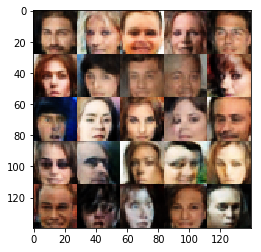

Epoch 10/10... Discriminator Loss: 1.2978... Generator Loss: 0.7635
Epoch 10/10... Discriminator Loss: 1.3694... Generator Loss: 0.7192
Epoch 10/10... Discriminator Loss: 1.2681... Generator Loss: 0.6168
Epoch 10/10... Discriminator Loss: 1.3256... Generator Loss: 0.6435
Epoch 10/10... Discriminator Loss: 1.3551... Generator Loss: 0.5636
Epoch 10/10... Discriminator Loss: 1.2874... Generator Loss: 0.6470
Epoch 10/10... Discriminator Loss: 1.3267... Generator Loss: 0.6718
Epoch 10/10... Discriminator Loss: 1.3900... Generator Loss: 0.6200
Epoch 10/10... Discriminator Loss: 1.3430... Generator Loss: 0.6781
Epoch 10/10... Discriminator Loss: 1.3359... Generator Loss: 0.6209


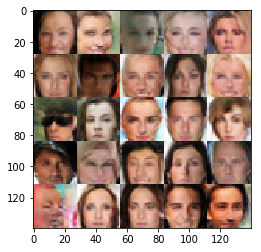

Epoch 10/10... Discriminator Loss: 1.4650... Generator Loss: 0.7037
Epoch 10/10... Discriminator Loss: 1.3291... Generator Loss: 0.5935
Epoch 10/10... Discriminator Loss: 1.3991... Generator Loss: 0.8483
Epoch 10/10... Discriminator Loss: 1.3157... Generator Loss: 0.6755
Epoch 10/10... Discriminator Loss: 1.3155... Generator Loss: 0.6115
Epoch 10/10... Discriminator Loss: 1.3068... Generator Loss: 0.6338
Epoch 10/10... Discriminator Loss: 1.3844... Generator Loss: 0.5814
Epoch 10/10... Discriminator Loss: 1.2701... Generator Loss: 0.6419
Epoch 10/10... Discriminator Loss: 1.5063... Generator Loss: 0.4095
Epoch 10/10... Discriminator Loss: 1.5045... Generator Loss: 0.4645


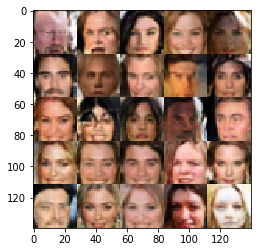

Epoch 10/10... Discriminator Loss: 1.3334... Generator Loss: 0.5839
Epoch 10/10... Discriminator Loss: 1.3619... Generator Loss: 0.5287
Epoch 10/10... Discriminator Loss: 1.3183... Generator Loss: 0.6229
Epoch 10/10... Discriminator Loss: 1.3306... Generator Loss: 0.7182
Epoch 10/10... Discriminator Loss: 1.2663... Generator Loss: 0.7237
Epoch 10/10... Discriminator Loss: 1.4564... Generator Loss: 0.6086
Epoch 10/10... Discriminator Loss: 1.4616... Generator Loss: 0.4661
Epoch 10/10... Discriminator Loss: 1.2905... Generator Loss: 0.6615
Epoch 10/10... Discriminator Loss: 1.3893... Generator Loss: 0.6184
Epoch 10/10... Discriminator Loss: 1.2684... Generator Loss: 0.6888


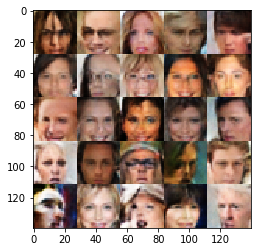

Epoch 10/10... Discriminator Loss: 1.3226... Generator Loss: 0.6661
Epoch 10/10... Discriminator Loss: 1.3355... Generator Loss: 0.8260
Epoch 10/10... Discriminator Loss: 1.3402... Generator Loss: 0.7365
Epoch 10/10... Discriminator Loss: 1.4005... Generator Loss: 0.5239
Epoch 10/10... Discriminator Loss: 1.3291... Generator Loss: 0.5698
Epoch 10/10... Discriminator Loss: 1.4048... Generator Loss: 0.7732
Epoch 10/10... Discriminator Loss: 1.3620... Generator Loss: 0.7061
Epoch 10/10... Discriminator Loss: 1.3583... Generator Loss: 0.6195
Epoch 10/10... Discriminator Loss: 1.4803... Generator Loss: 0.6369
Epoch 10/10... Discriminator Loss: 1.4297... Generator Loss: 0.6434


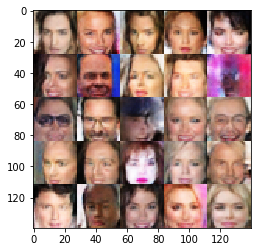

Epoch 10/10... Discriminator Loss: 1.3037... Generator Loss: 0.6425
Epoch 10/10... Discriminator Loss: 1.3370... Generator Loss: 0.8635
Epoch 10/10... Discriminator Loss: 1.1467... Generator Loss: 0.8274
Epoch 10/10... Discriminator Loss: 1.2717... Generator Loss: 0.7174
Epoch 10/10... Discriminator Loss: 1.5059... Generator Loss: 0.6159
Epoch 10/10... Discriminator Loss: 1.3453... Generator Loss: 0.6163
Epoch 10/10... Discriminator Loss: 1.2984... Generator Loss: 0.6260
Epoch 10/10... Discriminator Loss: 1.3481... Generator Loss: 0.6046
Epoch 10/10... Discriminator Loss: 1.3192... Generator Loss: 0.5586
Epoch 10/10... Discriminator Loss: 1.3706... Generator Loss: 0.5801


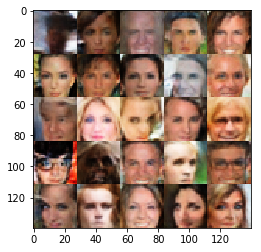

Epoch 10/10... Discriminator Loss: 1.2644... Generator Loss: 0.6534
Epoch 10/10... Discriminator Loss: 1.2916... Generator Loss: 0.6360
Epoch 10/10... Discriminator Loss: 1.3485... Generator Loss: 0.6695
Epoch 10/10... Discriminator Loss: 1.3067... Generator Loss: 0.5549
Epoch 10/10... Discriminator Loss: 1.3036... Generator Loss: 0.6063
Epoch 10/10... Discriminator Loss: 1.4612... Generator Loss: 0.4631
Epoch 10/10... Discriminator Loss: 1.3870... Generator Loss: 0.6997
Epoch 10/10... Discriminator Loss: 1.2919... Generator Loss: 0.8343
Epoch 10/10... Discriminator Loss: 1.3039... Generator Loss: 0.6272
Epoch 10/10... Discriminator Loss: 1.3418... Generator Loss: 0.6255


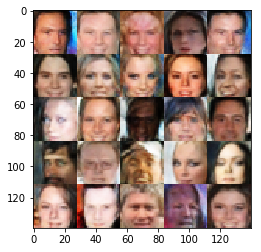

Epoch 10/10... Discriminator Loss: 1.2984... Generator Loss: 0.7502
Epoch 10/10... Discriminator Loss: 1.5010... Generator Loss: 0.4374
Epoch 10/10... Discriminator Loss: 1.3016... Generator Loss: 0.7066
Epoch 10/10... Discriminator Loss: 1.4416... Generator Loss: 0.5360
Epoch 10/10... Discriminator Loss: 1.3313... Generator Loss: 0.6633
Epoch 10/10... Discriminator Loss: 1.4712... Generator Loss: 0.4802
Epoch 10/10... Discriminator Loss: 1.3745... Generator Loss: 0.4804
Epoch 10/10... Discriminator Loss: 1.4113... Generator Loss: 0.8399
Epoch 10/10... Discriminator Loss: 1.3565... Generator Loss: 0.5708
Epoch 10/10... Discriminator Loss: 1.3978... Generator Loss: 0.4662


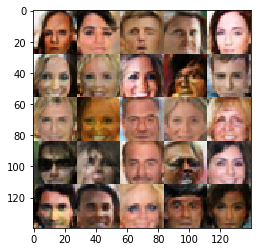

Epoch 10/10... Discriminator Loss: 1.2897... Generator Loss: 0.7331
Epoch 10/10... Discriminator Loss: 1.4226... Generator Loss: 0.6045
Epoch 10/10... Discriminator Loss: 1.3691... Generator Loss: 0.6921
Epoch 10/10... Discriminator Loss: 1.4069... Generator Loss: 0.6423
Epoch 10/10... Discriminator Loss: 1.3799... Generator Loss: 0.5420
Epoch 10/10... Discriminator Loss: 1.2378... Generator Loss: 0.6544
Epoch 10/10... Discriminator Loss: 1.4326... Generator Loss: 0.5251
Epoch 10/10... Discriminator Loss: 1.4311... Generator Loss: 0.6804
Epoch 10/10... Discriminator Loss: 1.2604... Generator Loss: 0.6852
Epoch 10/10... Discriminator Loss: 1.2839... Generator Loss: 0.5366


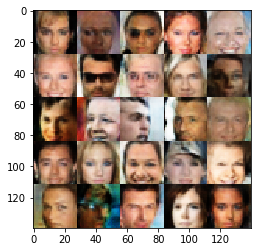

Epoch 10/10... Discriminator Loss: 1.3835... Generator Loss: 0.7127
Epoch 10/10... Discriminator Loss: 1.2794... Generator Loss: 0.6335


In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.50

import helper

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.